In [1]:
using CairoMakie, CSV, DataFrames, DataFramesMeta, Chain, GLM
CairoMakie.activate!()
Makie.inline!(true)

true

In [2]:
output_dir = "../../assets/plots/makie"

"../../assets/plots/makie"

In [3]:
x = 1:10
y = [3.2, -4.5, 7.8, 4.2, -2.0, 5.4, 7.8, -2.4, -3.1, 3.9]

10-element Vector{Float64}:
  3.2
 -4.5
  7.8
  4.2
 -2.0
  5.4
  7.8
 -2.4
 -3.1
  3.9

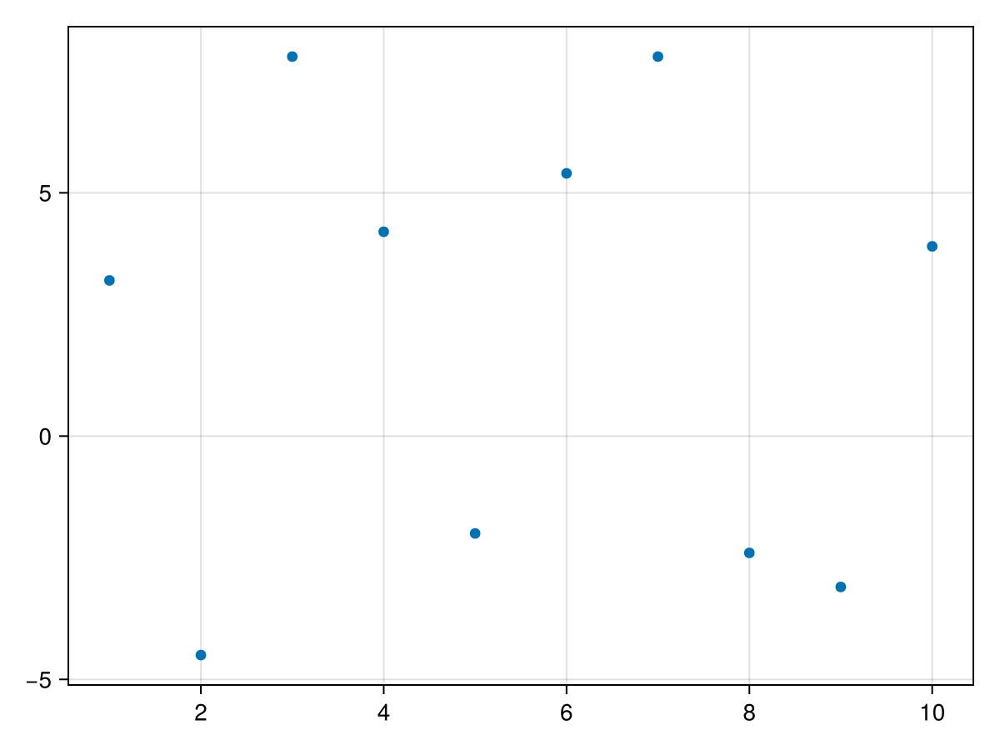

In [4]:
fig = scatter(x,y)

In [5]:
save("$output_dir/makie-scatter.png", fig)

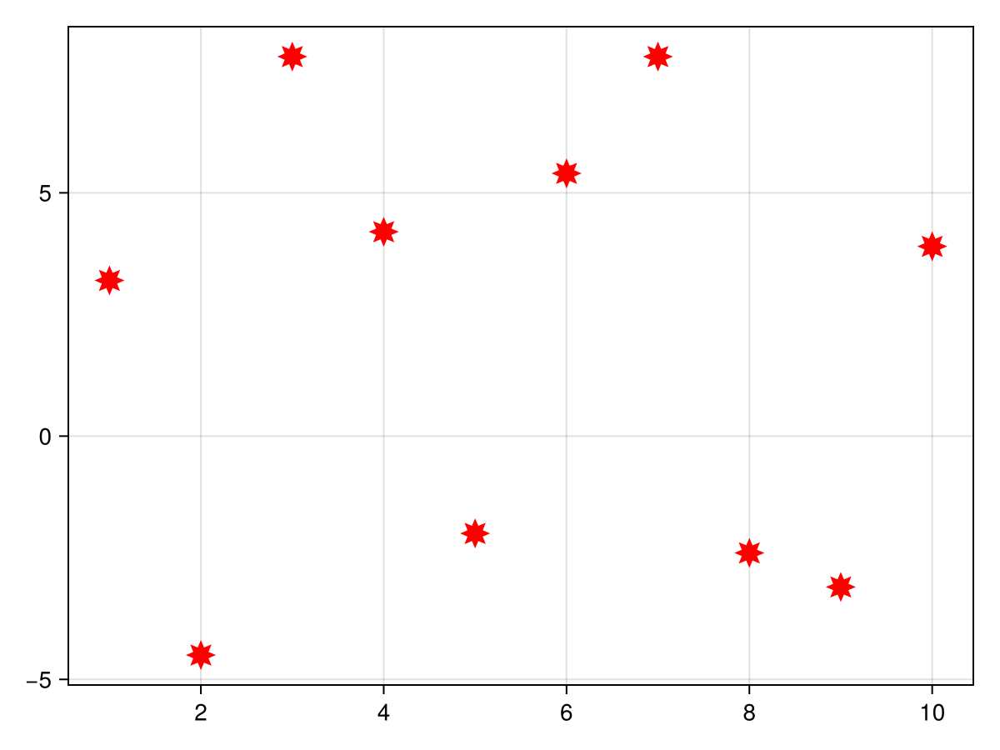

In [6]:
fig = scatter(x,y, marker = :star8, markersize = 20, color = :red)

In [7]:
save("$output_dir/makie-scatter2.png", fig)

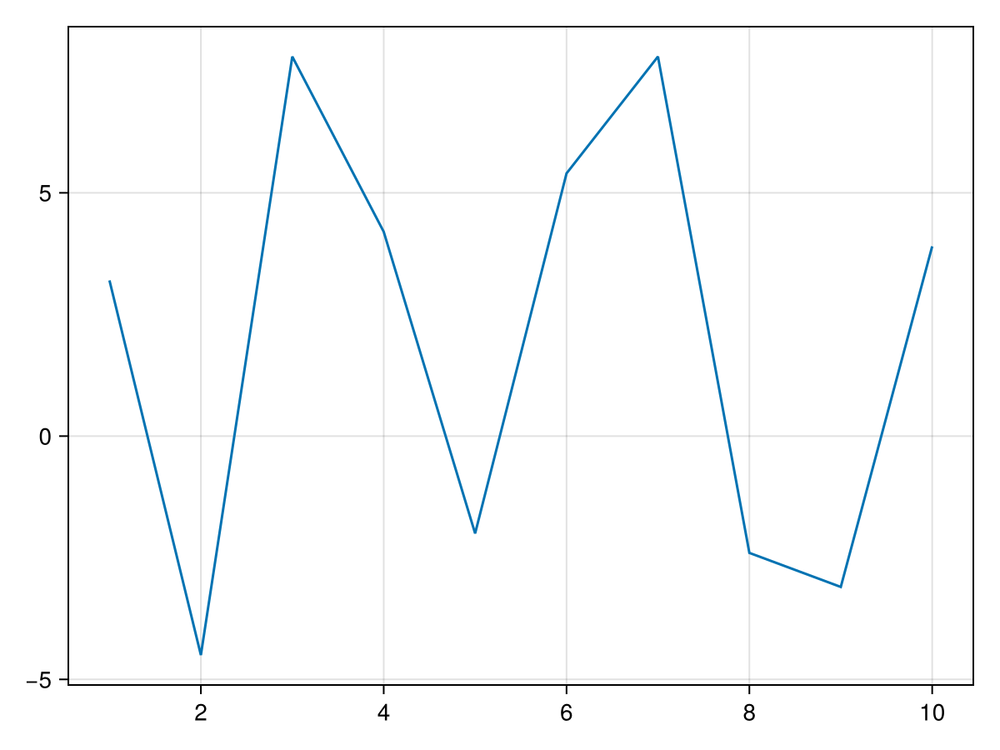

In [8]:
fig = lines(x,y)

In [9]:
save("$output_dir/makie-lines.png", fig)

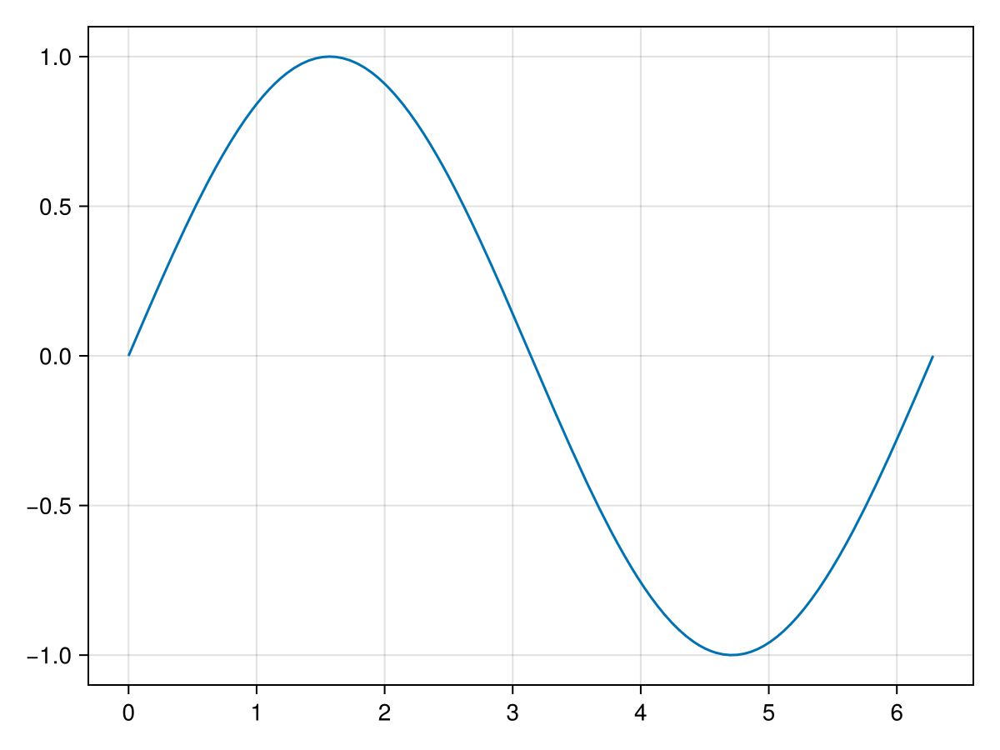

In [10]:
fig = lines(0..2pi, x -> sin(x))

In [11]:
typeof(0..2pi)

ClosedInterval{Float64} (alias for IntervalSets.Interval{:closed, :closed, Float64})

In [12]:
save("$output_dir/makie-function.png", fig)

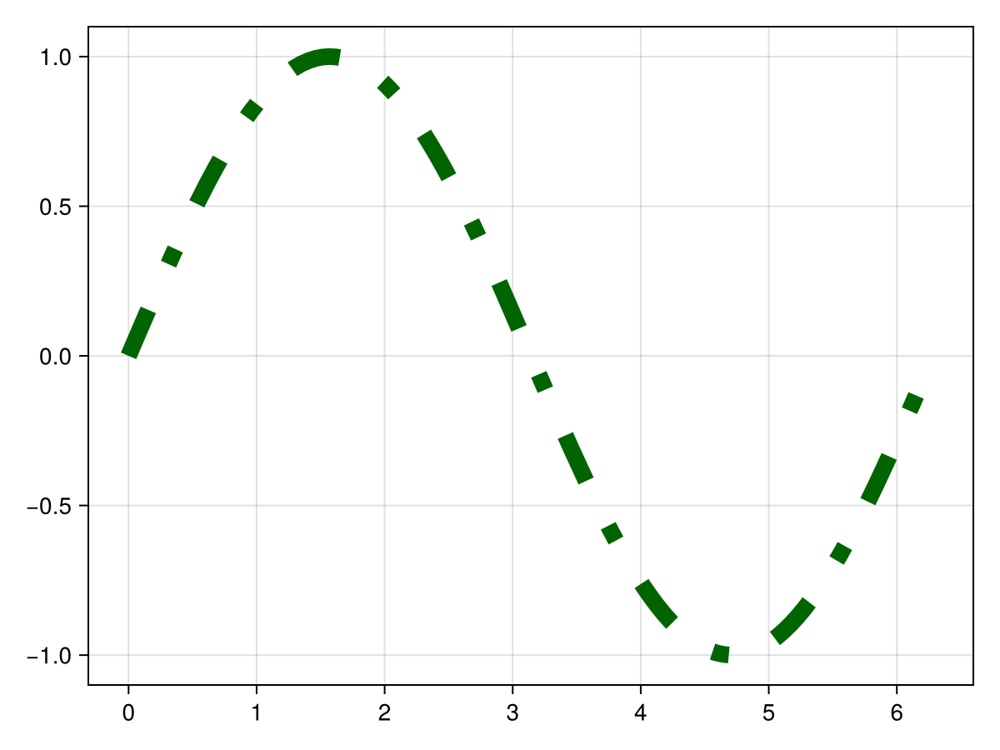

In [13]:
fig = lines(0..2pi, x -> sin(x), color = :darkgreen, linewidth = 10, linestyle = :dashdot)

In [14]:
save("$output_dir/makie-function2.png", fig)

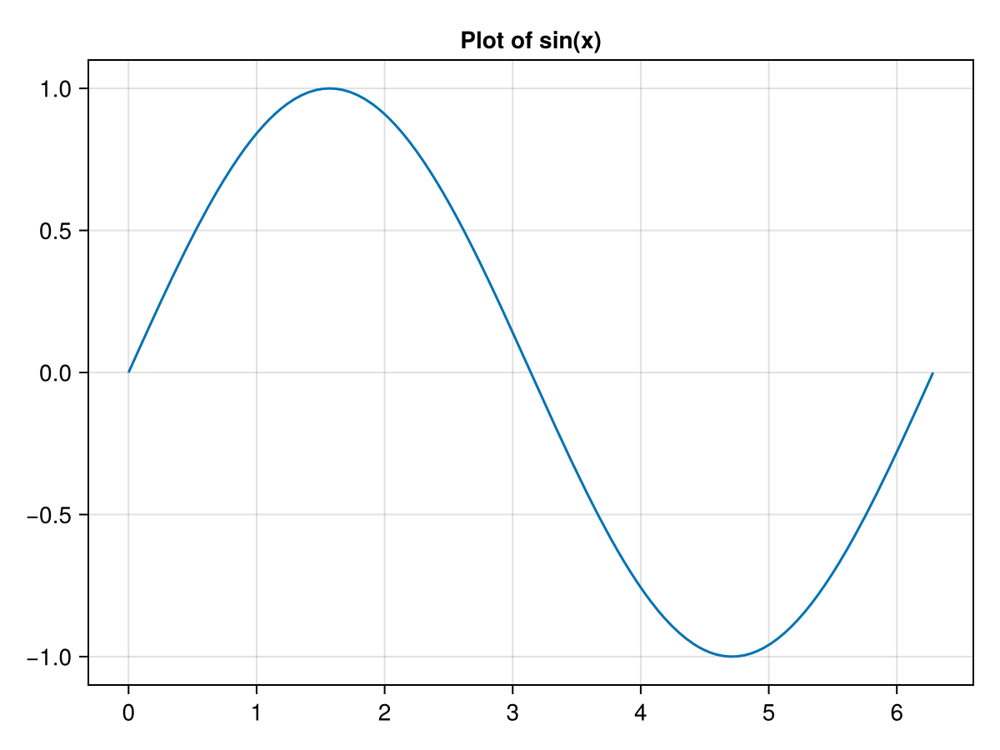

In [15]:
fig = lines(0..2pi, sin, axis = (title = "Plot of sin(x)",))

In [16]:
save("$output_dir/sine-options.png", fig)

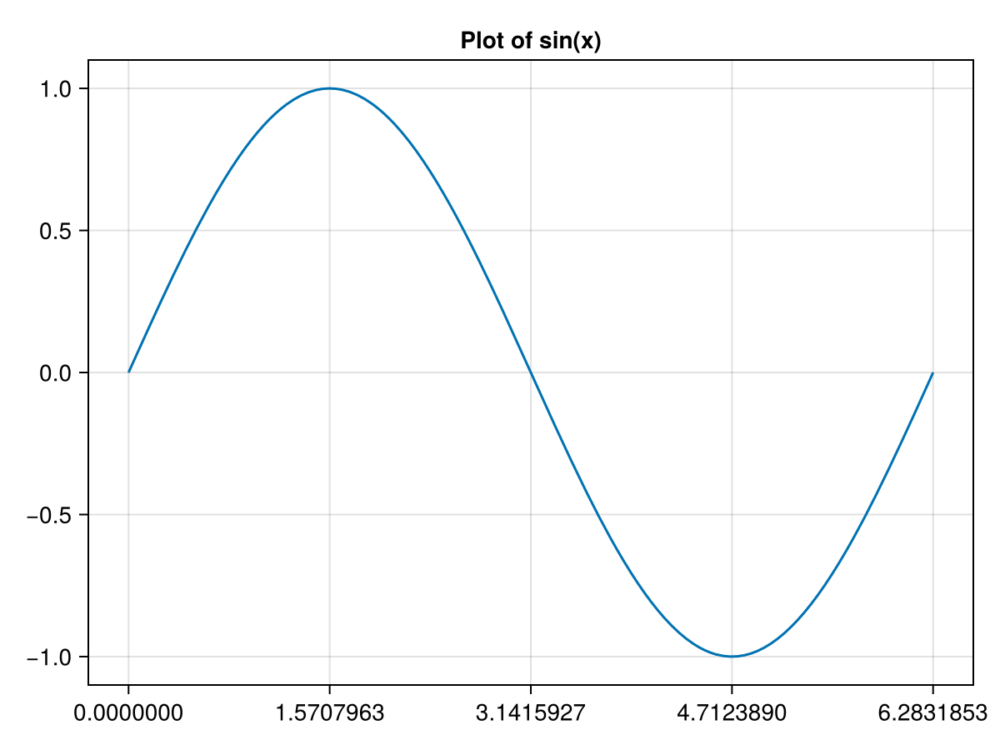

In [17]:
fig = lines(0..2pi, sin, axis = (title = "Plot of sin(x)", xticks=0:pi/2:2pi))

In [18]:
save("$output_dir/sine-options2.png", fig)

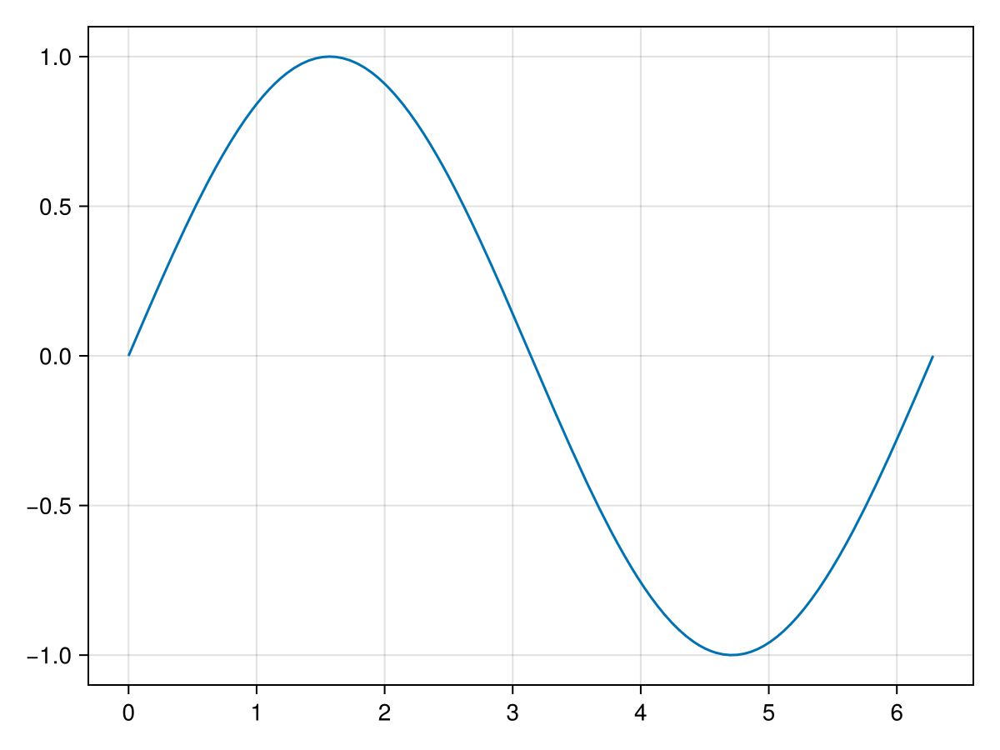

In [19]:
fig, ax = lines(0..2pi, sin)

In [20]:
save("$output_dir/sine.png", fig)

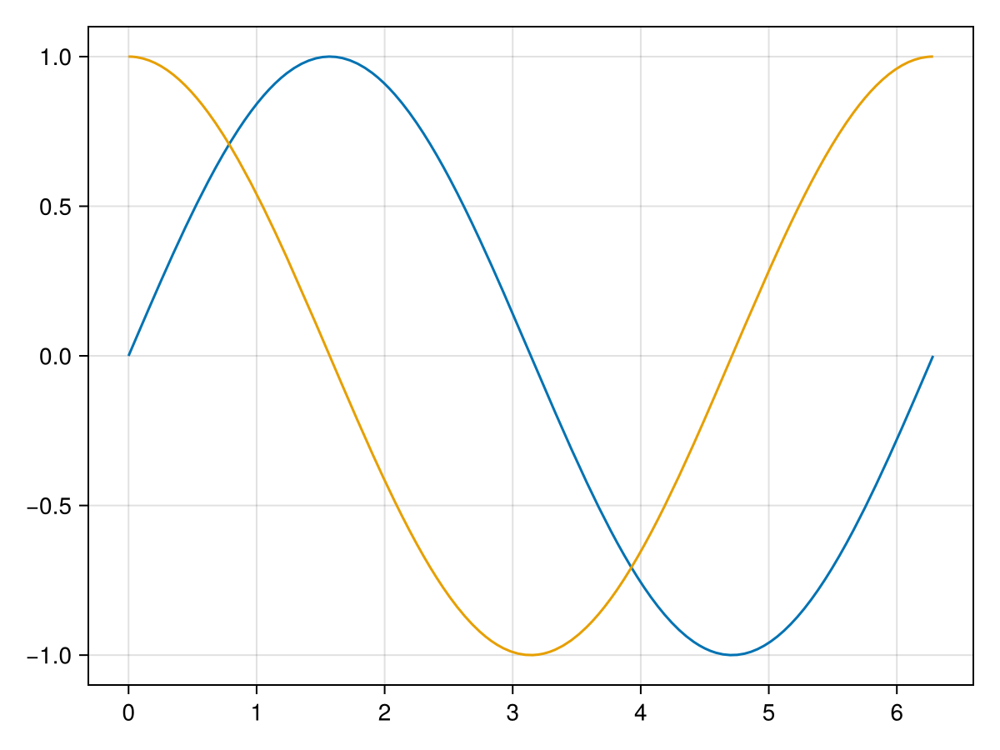

In [21]:
fig, ax = lines(0..2pi, sin)
lines!(ax, 0..2pi, cos)
fig

In [22]:
save("$output_dir/sine-options.png", fig)

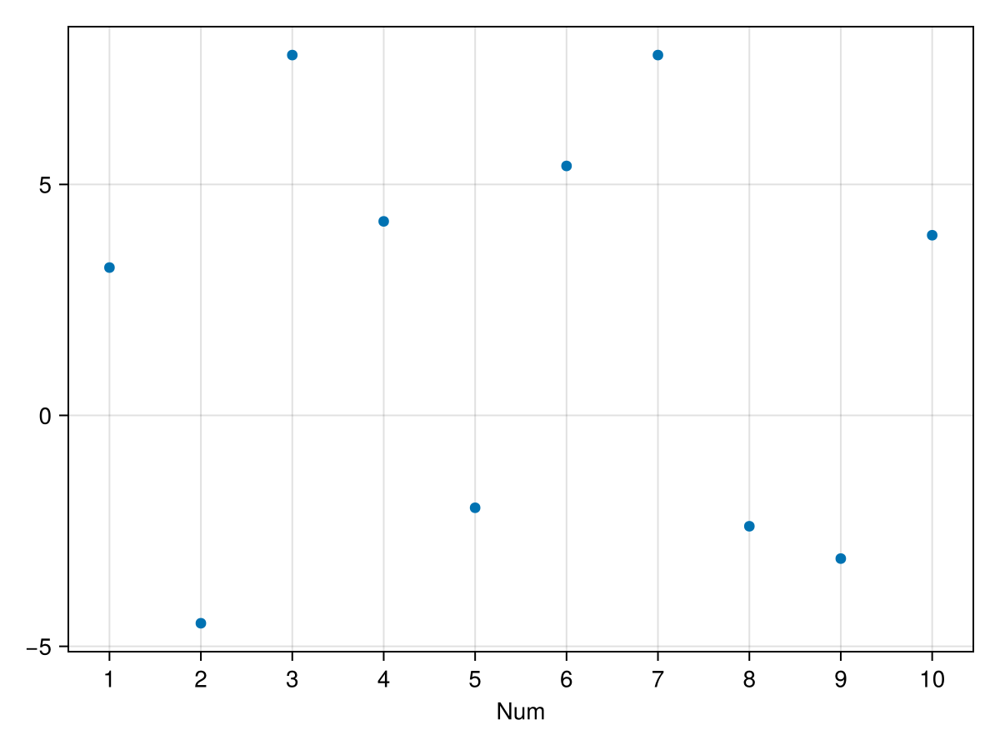

In [23]:
fig, ax = scatter(x,y)
ax.xlabel = "Num"
ax.xticks = 1:10
fig

In [24]:
save("$output_dir/scatter-options.png", fig)

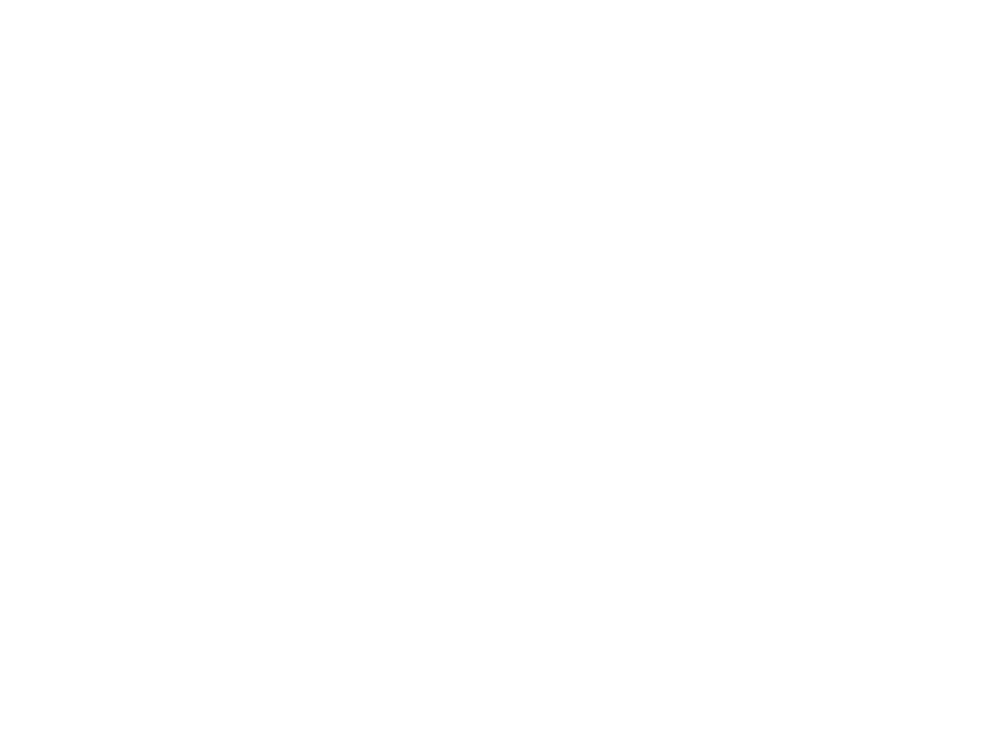

In [25]:
fig = Figure()

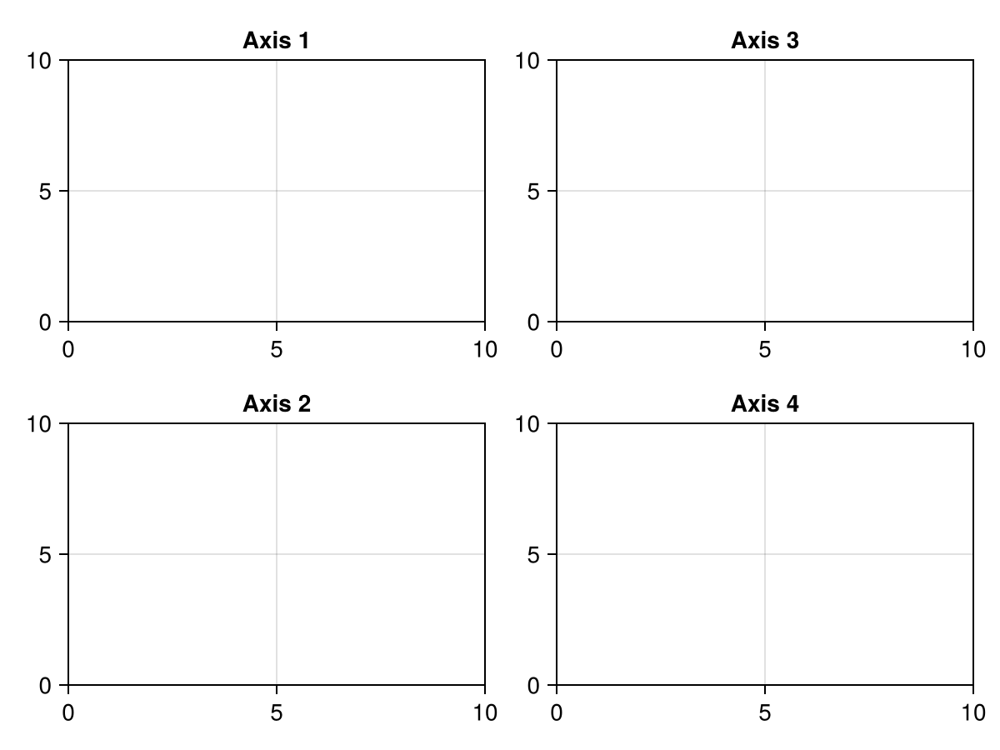

In [26]:
fig = Figure()
ax1 = Axis(fig[1,1], title = "Axis 1")
ax2 = Axis(fig[2,1], title = "Axis 2")
ax3 = Axis(fig[1,2], title = "Axis 3")
ax4 = Axis(fig[2,2], title = "Axis 4")
fig

In [27]:
save("$output_dir/layout.png", fig)

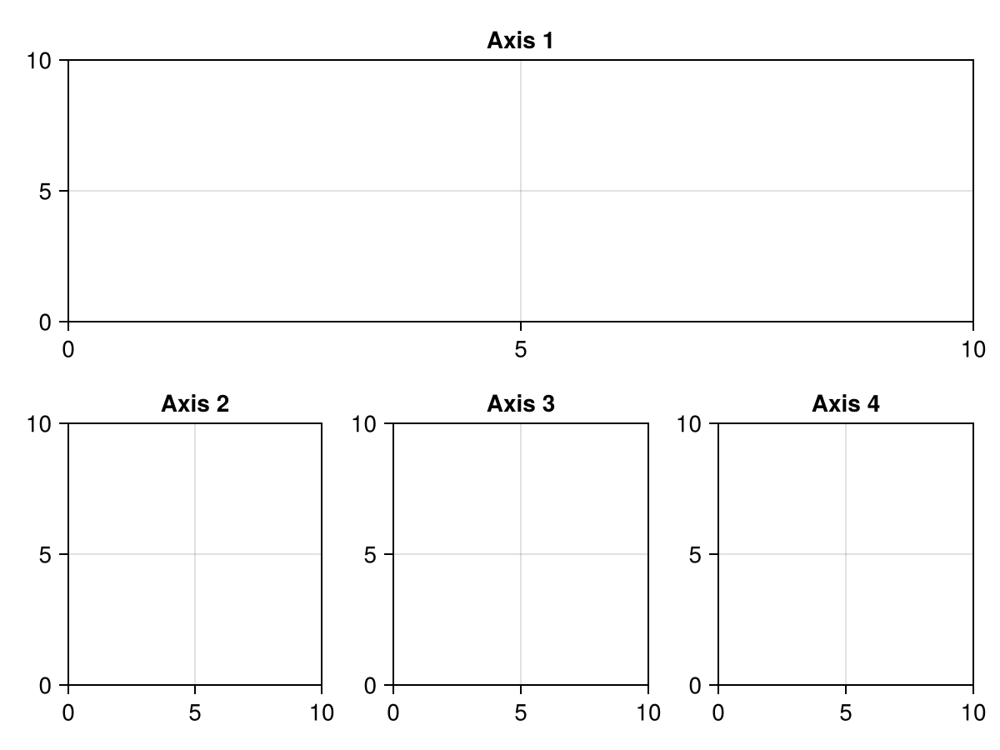

In [28]:
fig = Figure()
ax1 = Axis(fig[1,1:3], title = "Axis 1")
ax2 = Axis(fig[2,1], title = "Axis 2")
ax3 = Axis(fig[2,2], title = "Axis 3")
ax4 = Axis(fig[2,3], title = "Axis 4")
fig

In [29]:
save("$output_dir/layout-nested.png", fig)

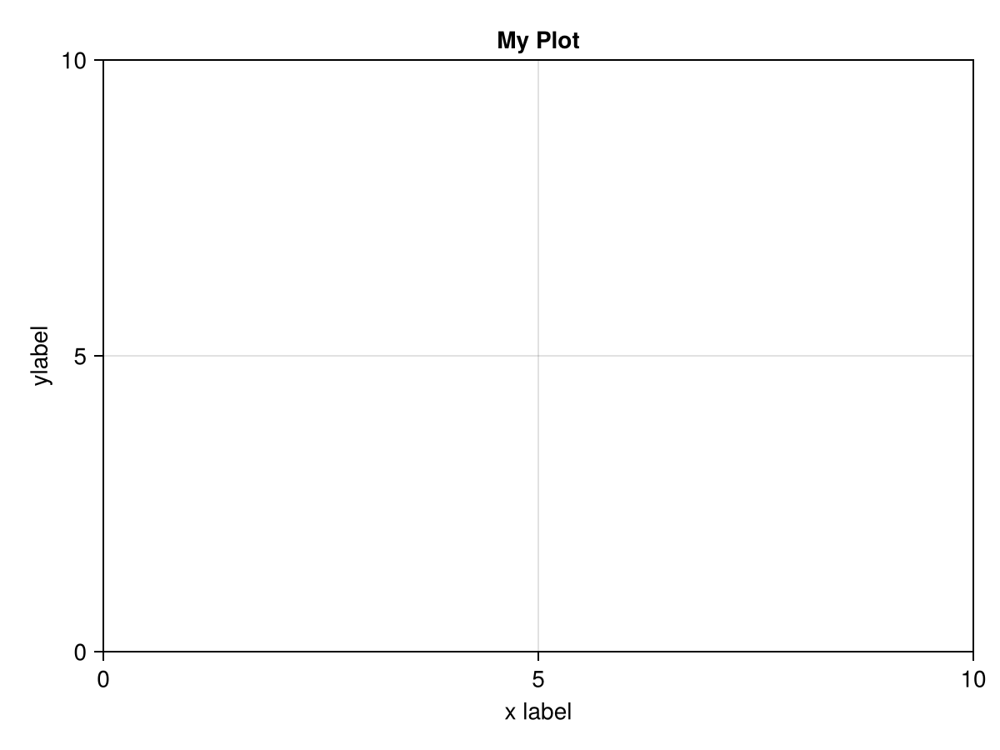

In [30]:
fig = Figure()
ax = Axis(fig[1,1], title = "My Plot", xlabel = "x label", ylabel = "ylabel")
fig

In [31]:
save("$output_dir/xylabels.png", fig)

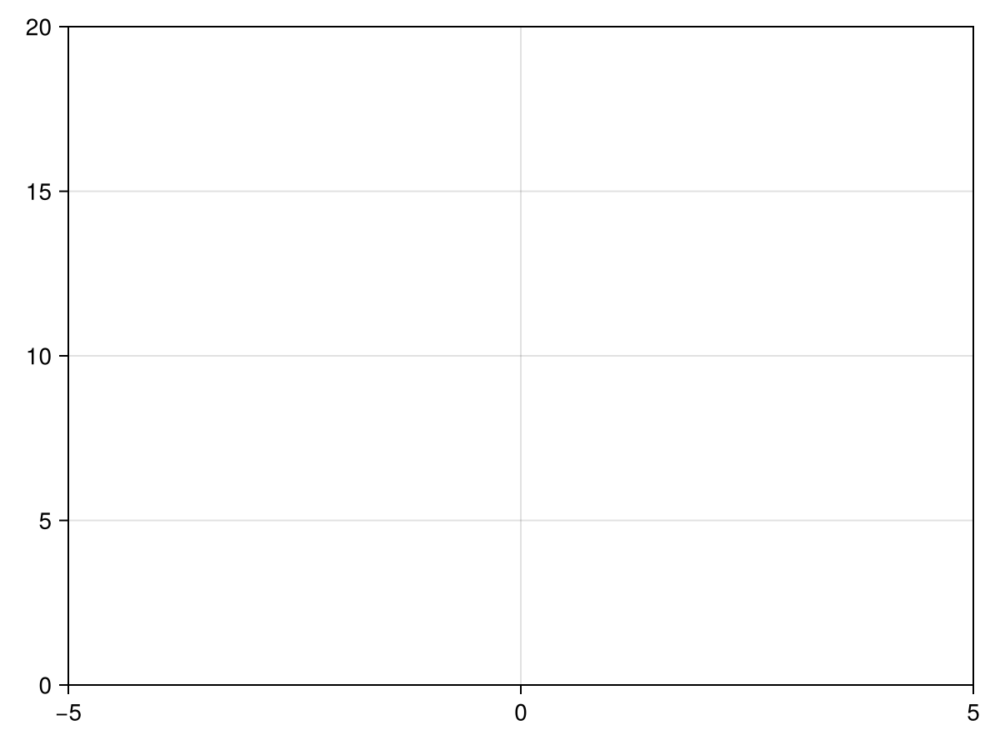

In [32]:
fig = Figure()
ax = Axis(fig[1,1], limits = (-5,5,0,20))
fig

In [33]:
save("$output_dir/limits.png", fig)

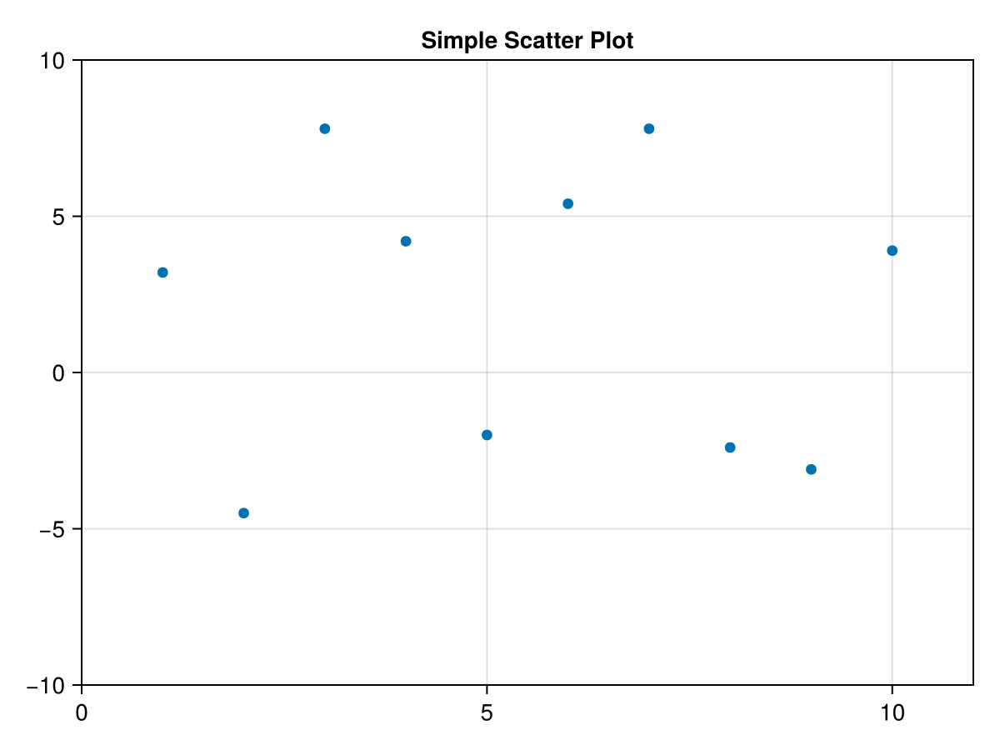

In [34]:
x = 1:10
y = [3.2, -4.5, 7.8, 4.2, -2.0, 5.4, 7.8, -2.4, -3.1, 3.9]
fig = Figure()
ax = Axis(fig[1, 1], title="Simple Scatter Plot", limits=(0, 11, -10, 10))
scatter!(ax, x, y)
fig

In [35]:
save("$output_dir/scatter2.png", fig)

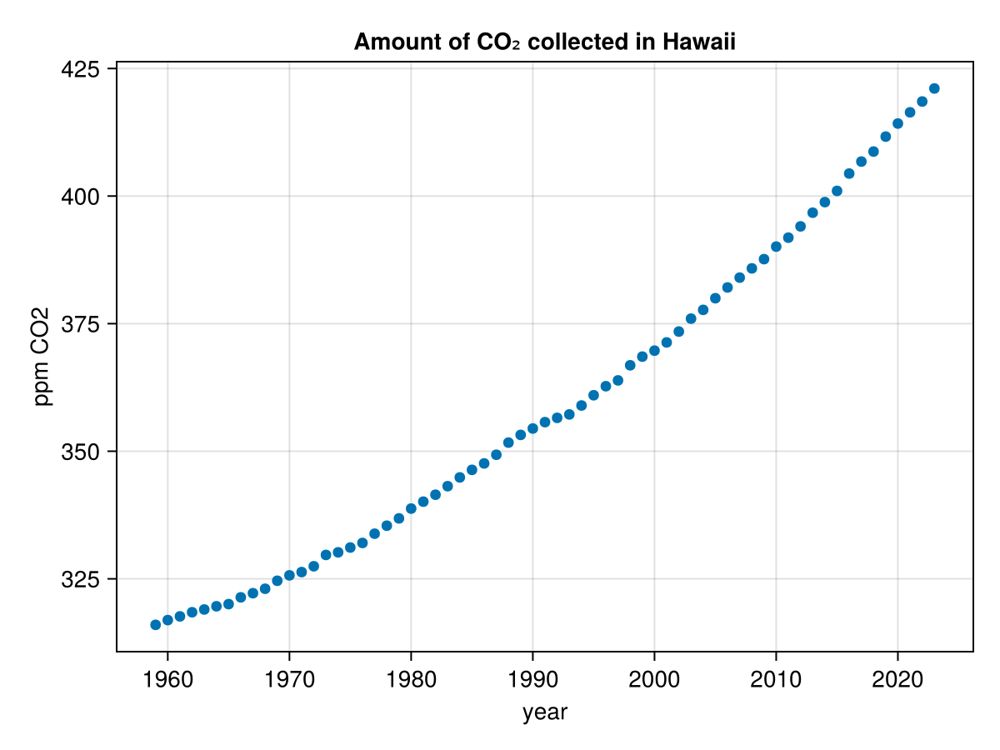

In [36]:
co2 = CSV.read("../data/co2_annmean_mlo.csv", DataFrame, header = 44, skipto = 45)
fig = Figure()
ax = Axis(fig[1,1], title = "Amount of CO₂ collected in Hawaii", 
xlabel = "year", ylabel = "ppm CO2")
scatter!(ax, co2.year, co2.mean)
fig

In [37]:
save("$output_dir/co2-scatter.png", fig)

In [38]:
lsq = @chain co2 begin
  @transform(:logco2 = log.(:mean))
  lm(@formula( logco2 ~ year), _)
end

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

logco2 ~ 1 + year

Coefficients:
────────────────────────────────────────────────────────────────────────────────
                   Coef.  Std. Error       t  Pr(>|t|)    Lower 95%    Upper 95%
────────────────────────────────────────────────────────────────────────────────
(Intercept)  -3.1637      0.113173    -27.95    <1e-36  -3.38986     -2.93754
year          0.00454247  5.68398e-5   79.92    <1e-64   0.00442888   0.00465605
────────────────────────────────────────────────────────────────────────────────

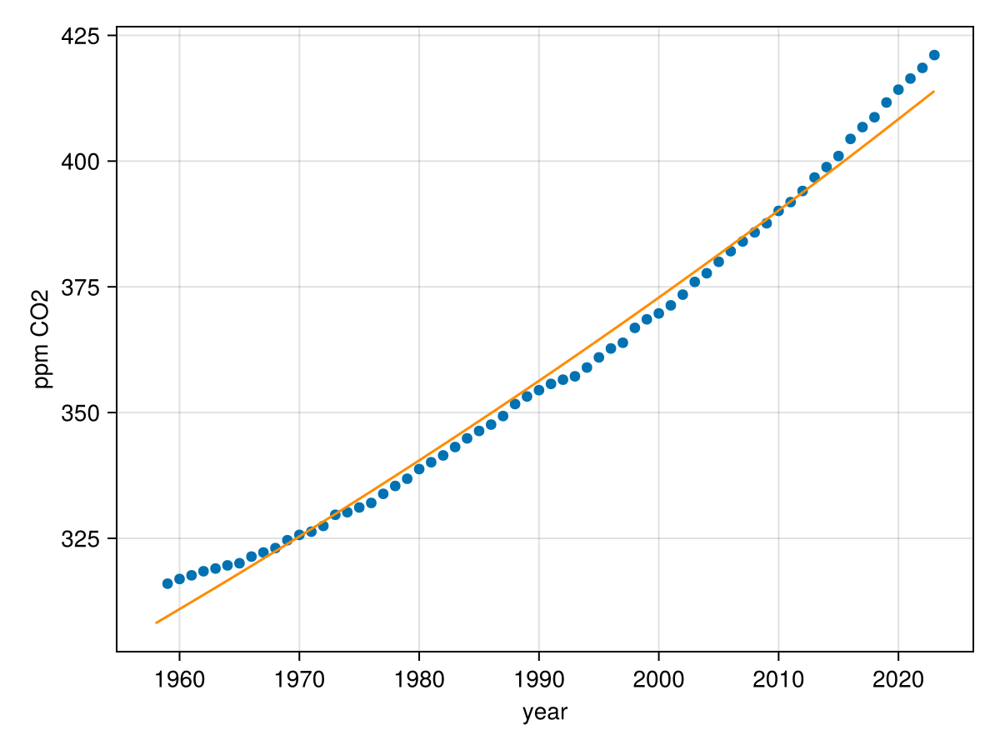

In [39]:
fig = Figure()
ax = Axis(fig[1,1], xlabel = "year", ylabel = "ppm CO2")
scatter!(ax, co2.year, co2.mean)
lines!(ax, 1958..2023, t->exp(-3.1637+0.00454247t), color = :darkorange)
fig


In [40]:
save("$output_dir/co2-scatter-fit.png", fig)

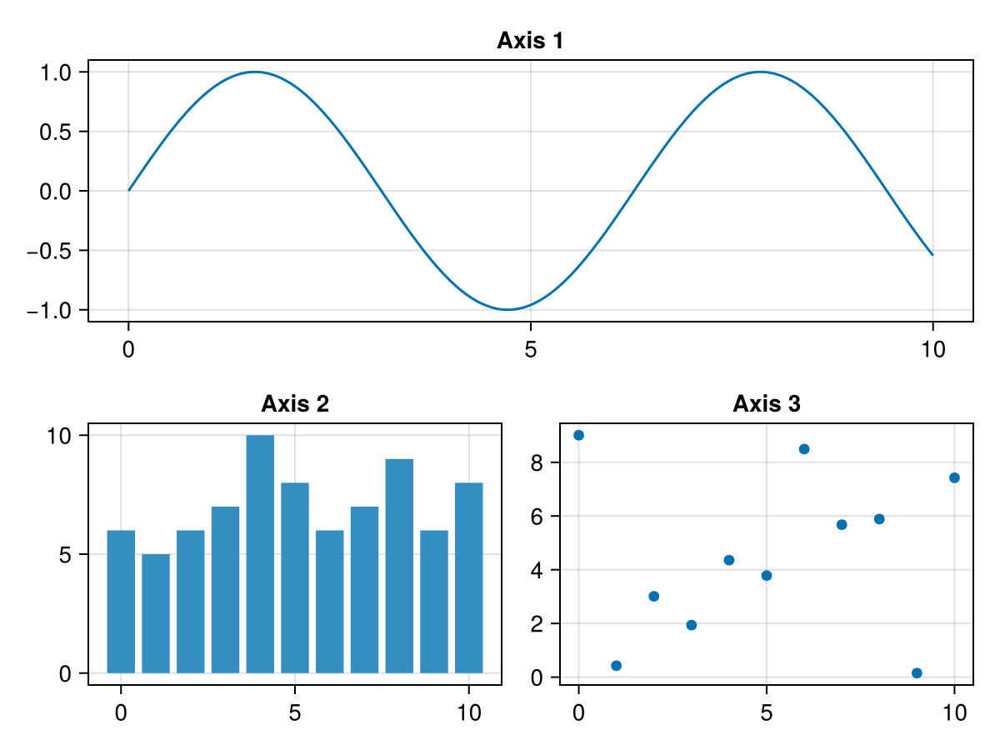

In [41]:
fig = Figure()
ax1 = Axis(fig[1,1], title="Axis 1")
ax2 = Axis(fig[2,1][1,1], title = "Axis 2")
ax3 = Axis(fig[2,1][1,2], title = "Axis 3")
lines!(ax1, 0..10,sin)
barplot!(ax2, 0:10, rand(5:10,11))
scatter!(ax3,0:10,10*rand(11))
fig

In [42]:
save("$output_dir/multi-plots.png", fig)

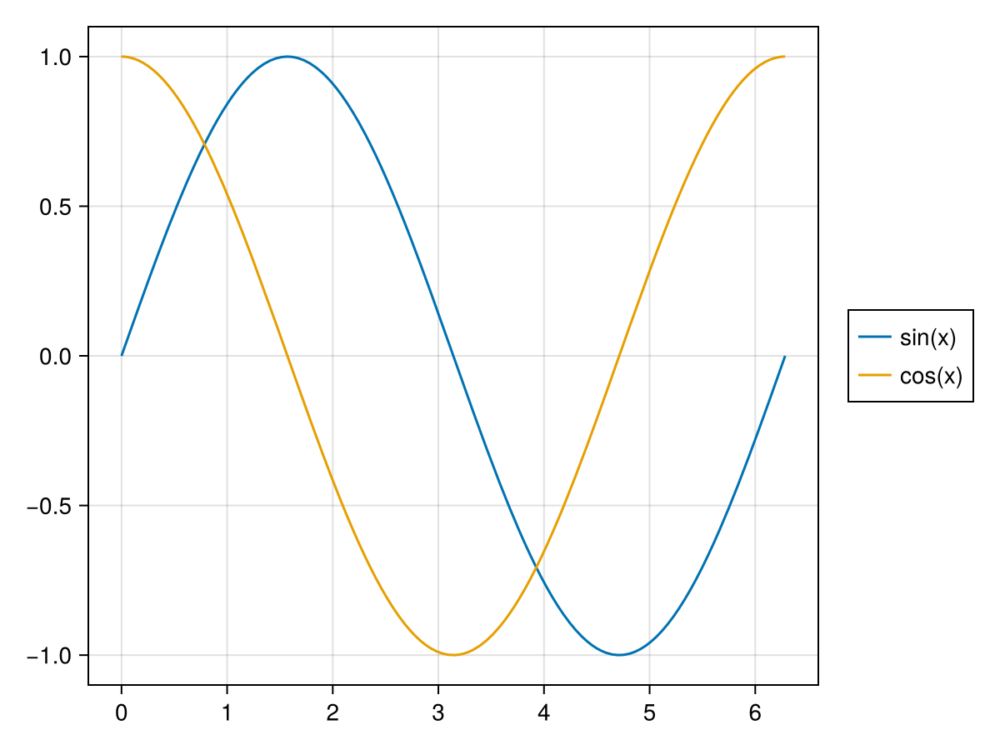

In [43]:
fig, ax = lines(0..2pi,sin, label = "sin(x)")
lines!(ax, 0..2pi, cos, label = "cos(x)")
Legend(fig[1,2], ax)
fig

In [44]:
save("$output_dir/legend01.png", fig)

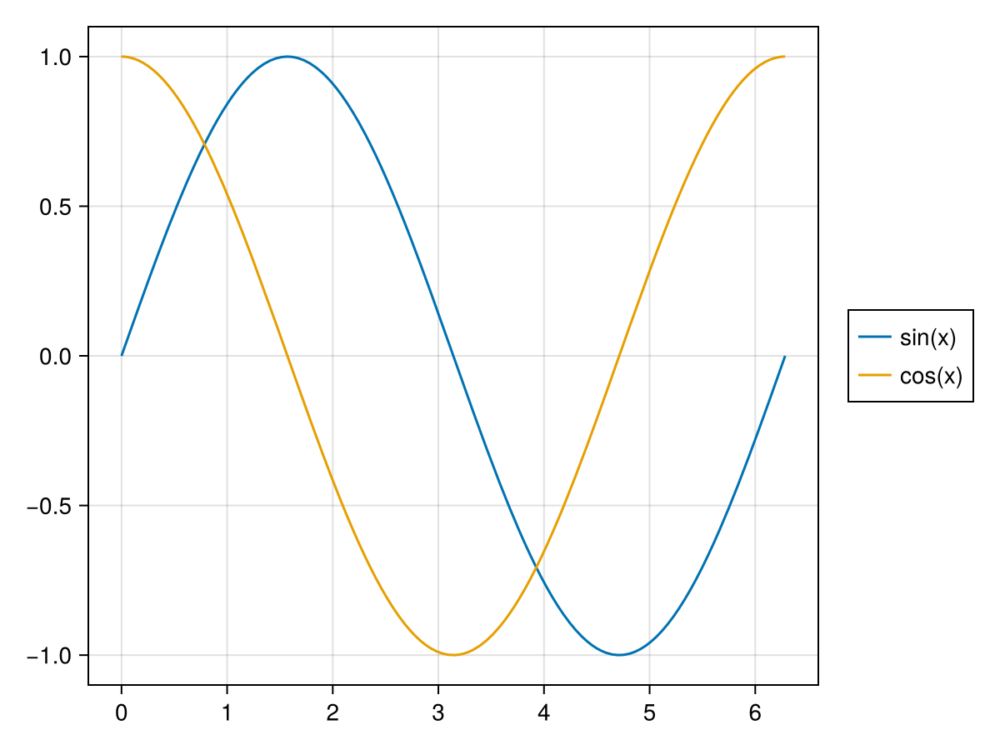

In [45]:
fig = Figure()
ax = Axis(fig[1, 1])
lines!(ax, 0 .. 2pi, sin, label="sin(x)")
lines!(ax, 0 .. 2pi, cos, label="cos(x)")
Legend(fig[1, 2], ax)
fig

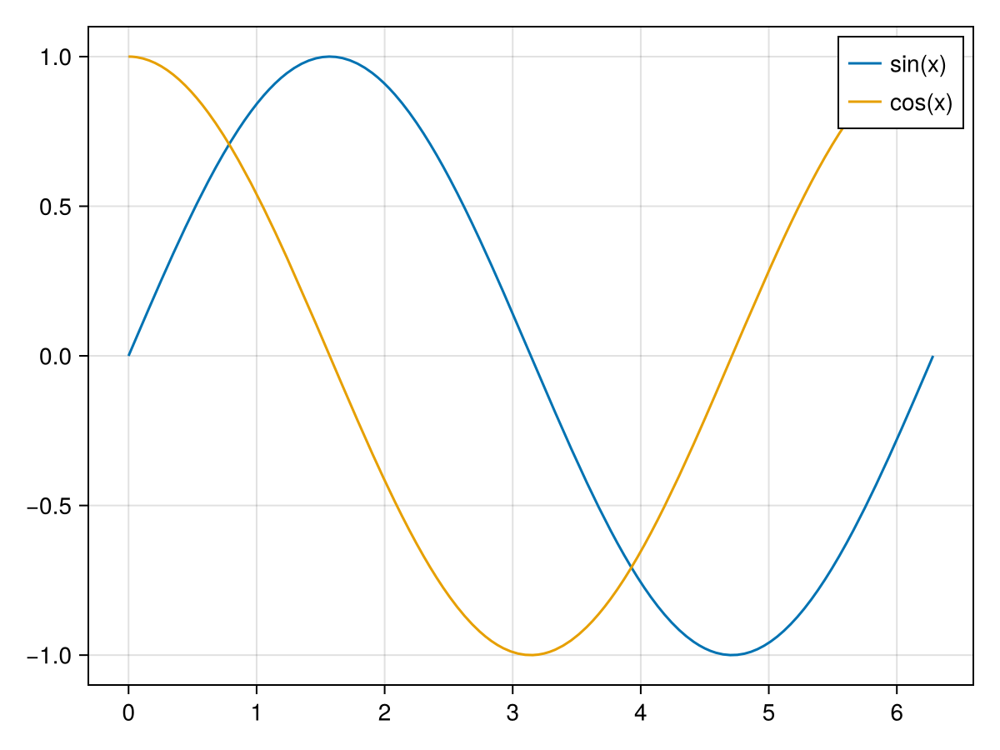

In [46]:
fig, ax = lines(0..2pi,sin,label="sin(x)")
lines!(ax,0..2pi,cos, label="cos(x)")
axislegend(ax)
fig

In [47]:
save("$output_dir/legend02.png", fig)

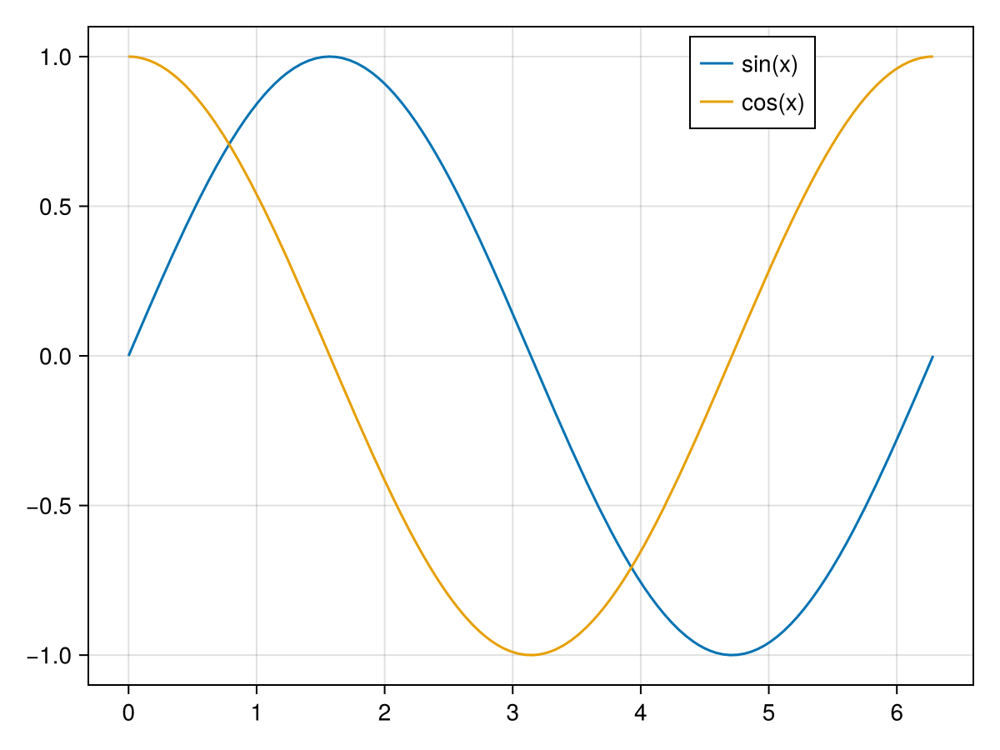

In [48]:
fig, ax = lines(0..2pi,sin,label="sin(x)")
lines!(ax,0..2pi,cos, label="cos(x)")
axislegend(ax, position = (0.8, 1))
fig

In [49]:
save("$output_dir/legend03.png", fig)

In [50]:
L"\frac{\pi}{2}"

L"$\frac{\pi}{2}$"

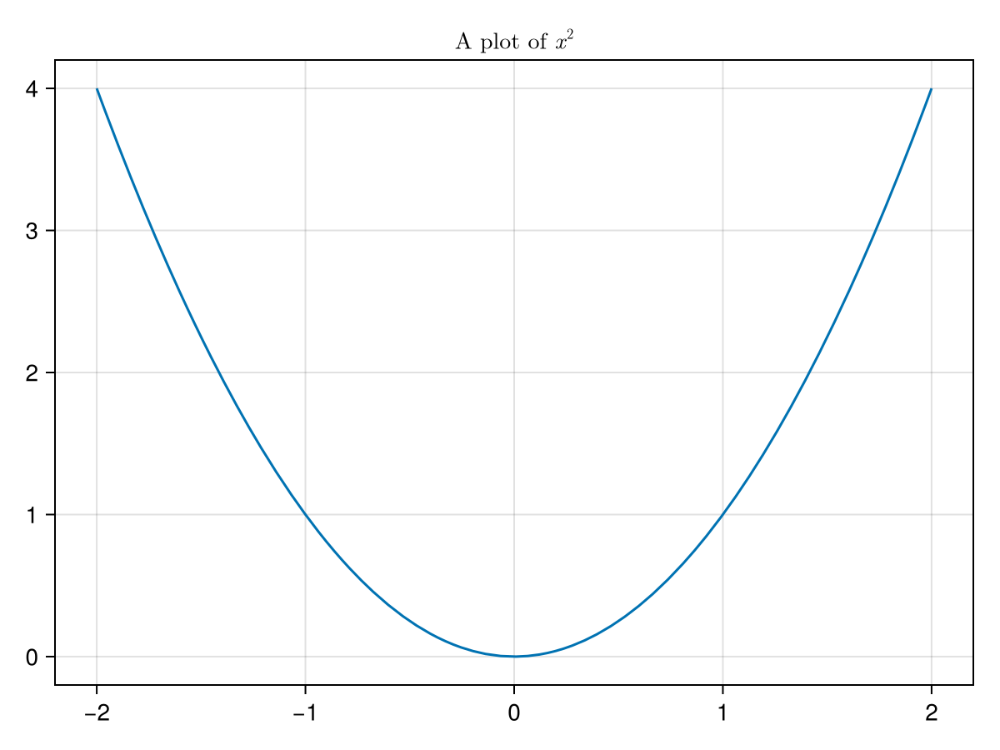

In [51]:
fig, ax = lines(-2..2,x -> x^2, axis = (title = L"A plot of $x^2$",))

In [52]:
save("$output_dir/xsq-with-title.png", fig)

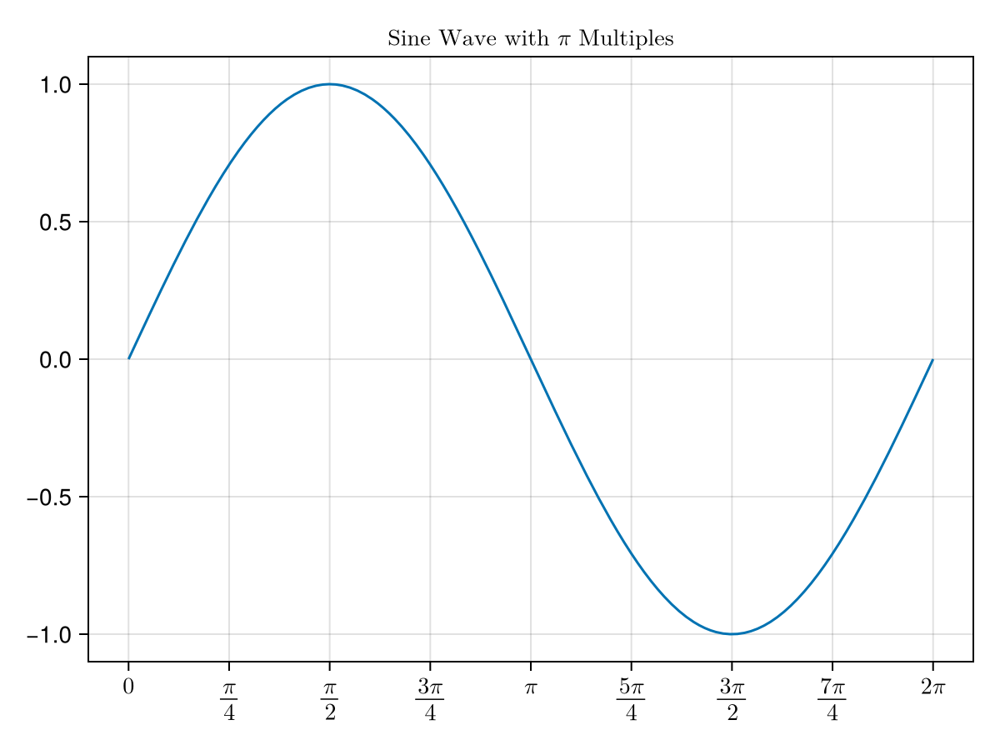

In [53]:
tick_pos = 0:pi/4:2pi
xlabels = [L"0", L"\frac{\pi}{4}", L"\frac{\pi}{2}", L"\frac{3\pi}{4}",
  L"\pi", L"\frac{5\pi}{4}", L"\frac{3\pi}{2}", L"\frac{7\pi}{4}", L"2\pi"]

fig = Figure()
ax = Axis(fig[1, 1],
  xticks=(tick_pos, xlabels),
  title=L"Sine Wave with $\pi$ Multiples"
)

lines!(ax, 0 .. 2pi, sin)
fig

In [54]:
save("$output_dir/sine-with-xticks.png", fig)

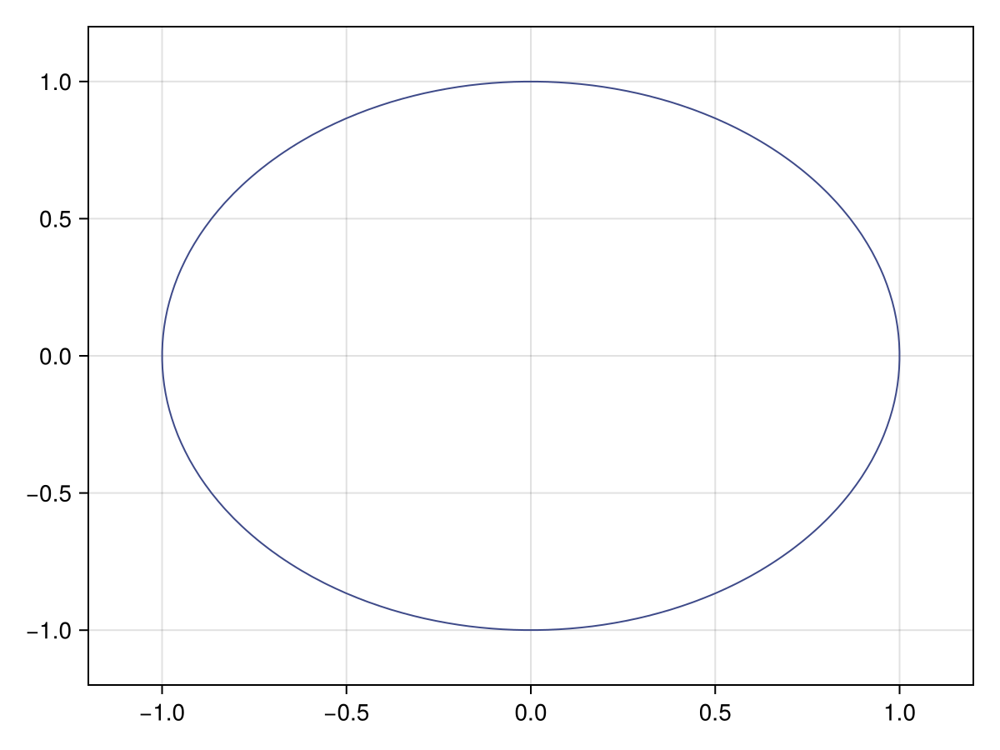

In [55]:
# fig = Figure()
# ax = Axis(fig[1, 1], aspect = 1)
xs = ys =  LinRange(-1.5, 1.5, 100)
fig = contour(xs, ys, (x, y) -> x^2 + y^2 - 1, levels=[0], axis=(limits = (-1.2, 1.2, -1.2,1.2),))
# fig

In [56]:
save("$output_dir/implicit-circle01.png", fig)

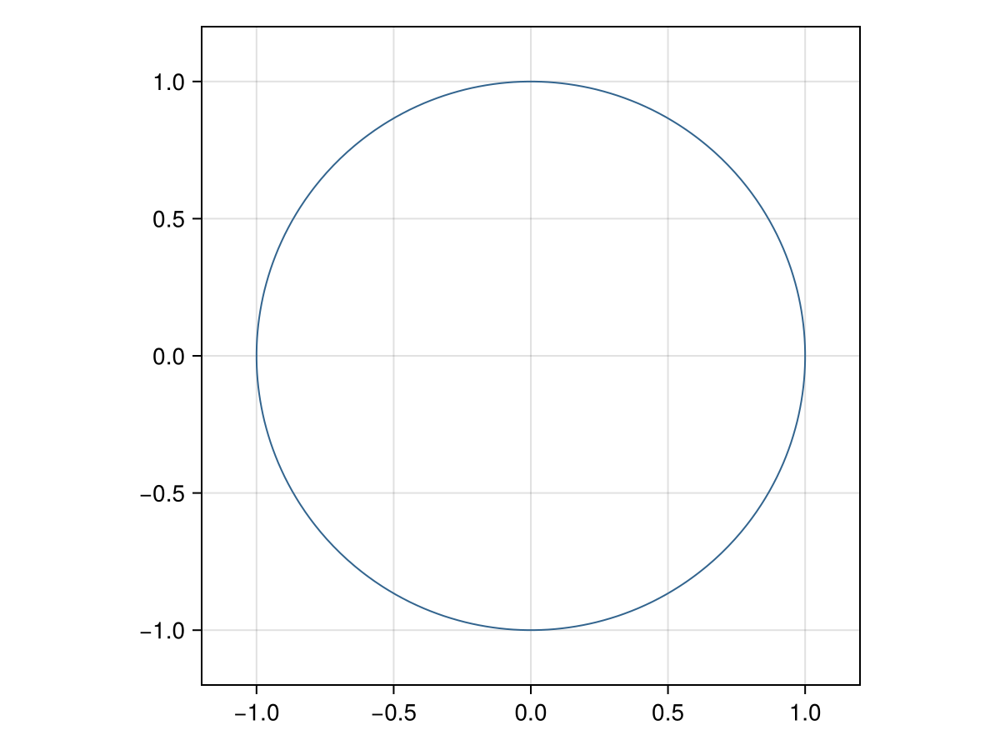

In [57]:
xs = ys =  LinRange(-1.25, 1.25, 100)
fig = contour(xs, ys, (x, y) -> x^2 + y^2 - 1, 
  levels=[0], axis=(limits = (-1.2, 1.2, -1.2,1.2), aspect = 1))


In [58]:
save("$output_dir/implicit-circle02.png", fig)

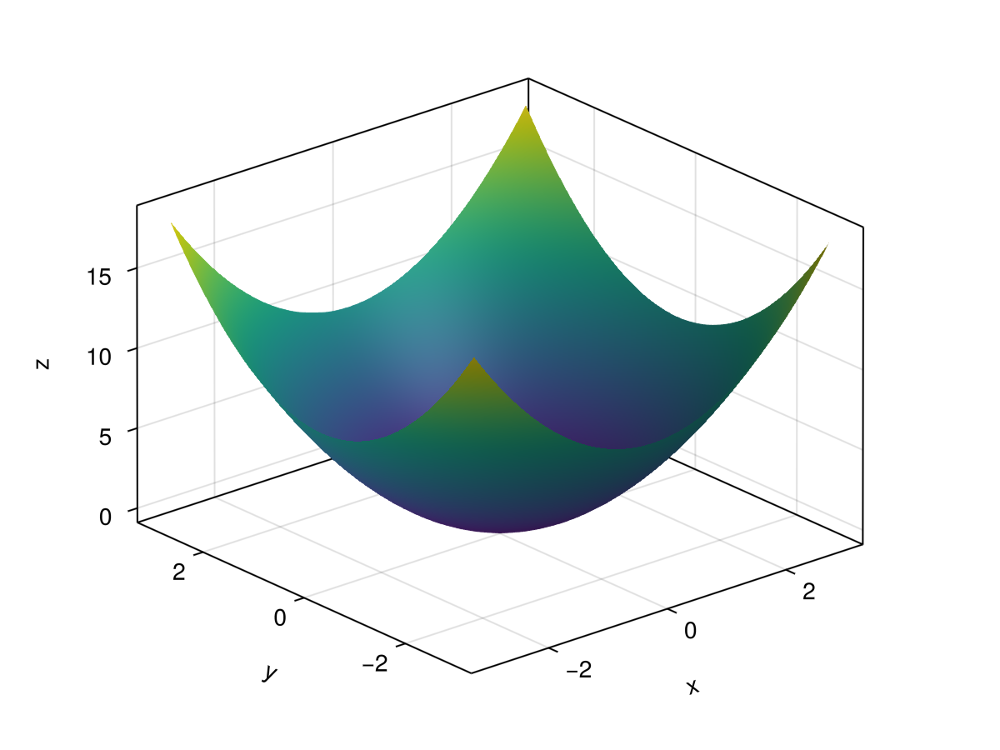

In [59]:
using GLMakie
GLMakie.activate!()
xs = ys = LinRange(-3, 3, 100)
zs = [x^2 + y^2 for x in xs, y in ys]

fig = surface(xs, ys, zs, axis=(type=Axis3,))

In [60]:
save("$output_dir/paraboloid.png", fig)

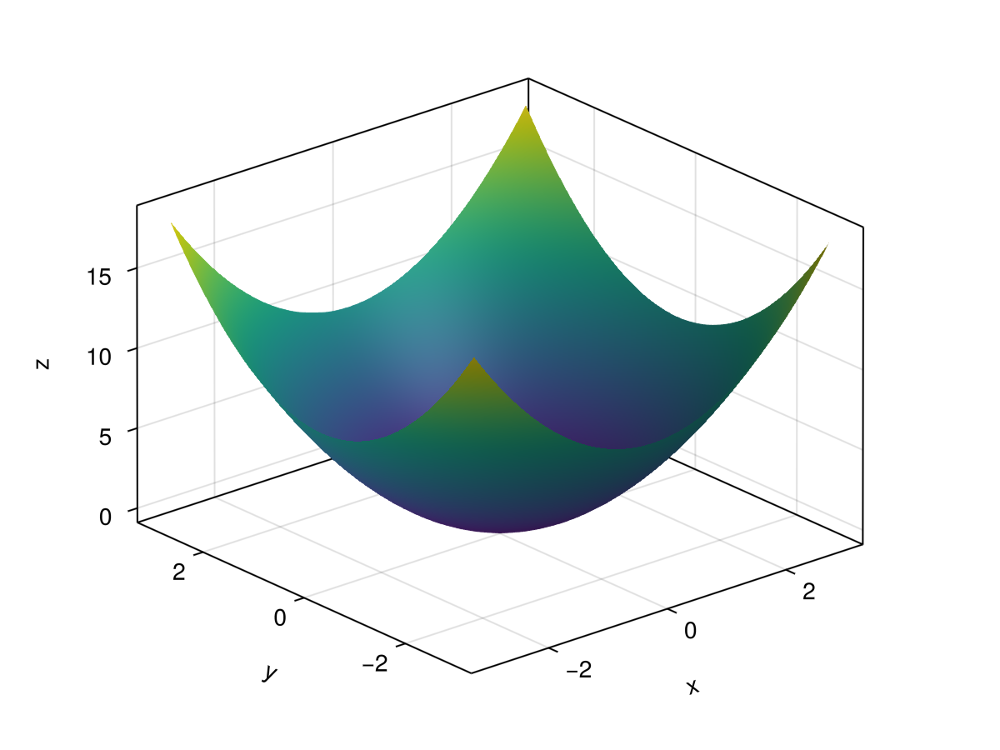

In [61]:
Makie.inline!(false) 
xs = ys = LinRange(-3, 3, 100)
zs = [x^2 + y^2 for x in xs, y in ys]

fig = surface(xs, ys, zs, axis=(type=Axis3,))

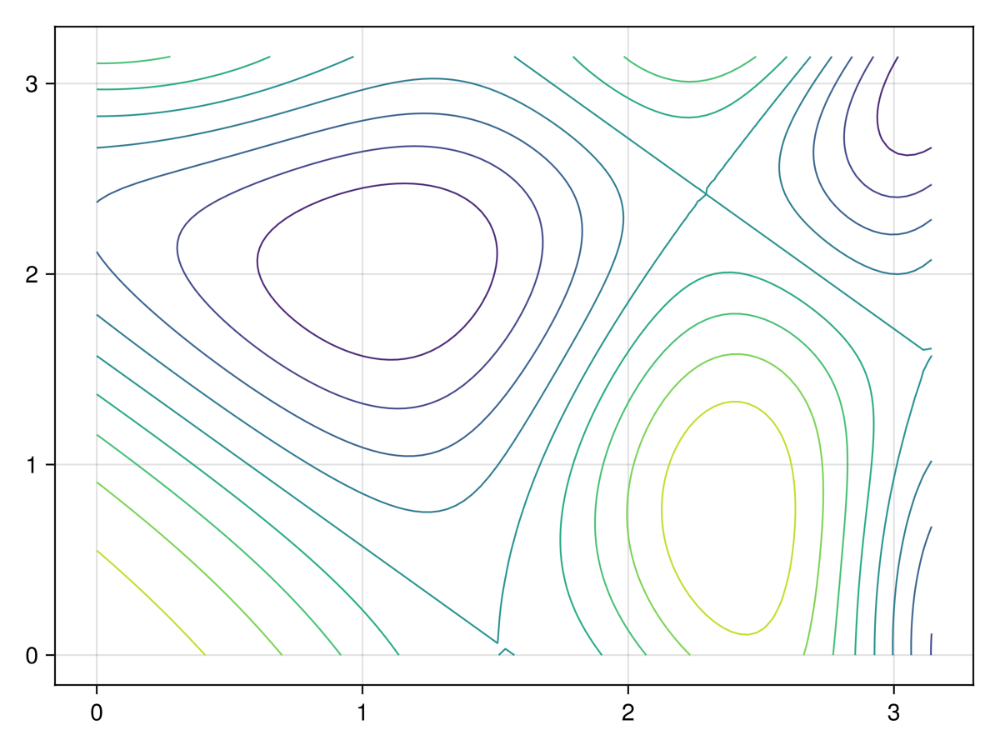

In [62]:
x = y = LinRange(0,pi,101)
fig = contour(x, y, (x, y) -> sin(0.5x^2-0.25y^2+2)*cos(x+y), levels = 9)

In [63]:
save("$output_dir/contour.png", fig)

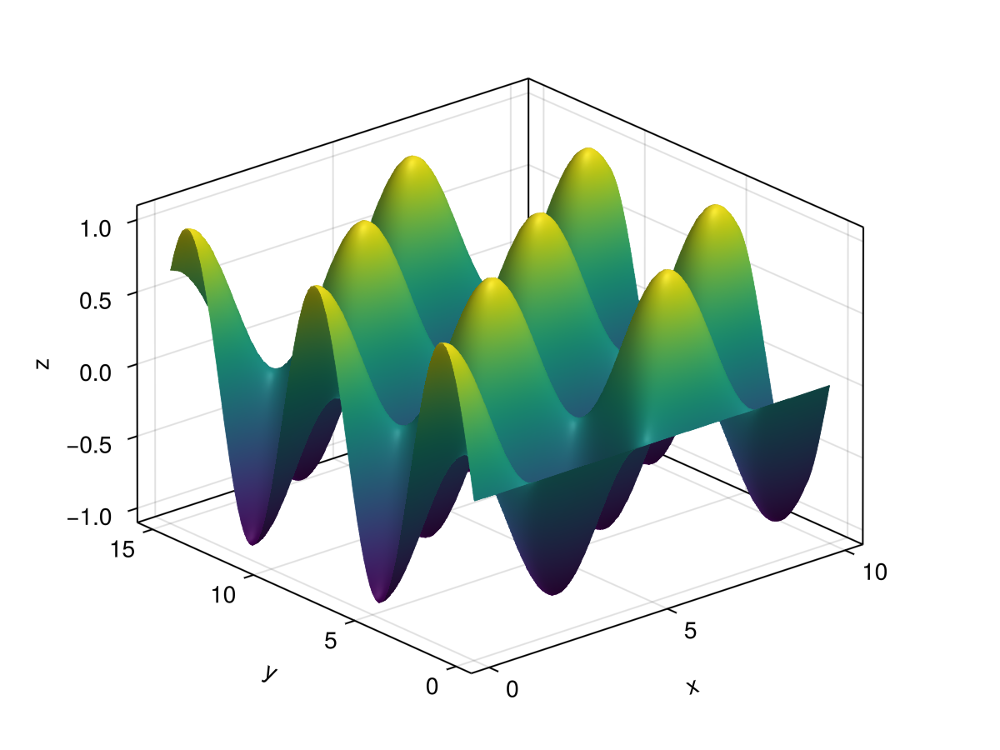

In [64]:
using GLMakie
GLMakie.activate!()
xs = LinRange(0, 10, 100)
ys = LinRange(0, 15, 100)
zs = [cos(x) * sin(y) for x in xs, y in ys]

fig = surface(xs, ys, zs, axis=(type=Axis3,))

In [65]:
save("$output_dir/surface.png", fig)

### Surface Plots

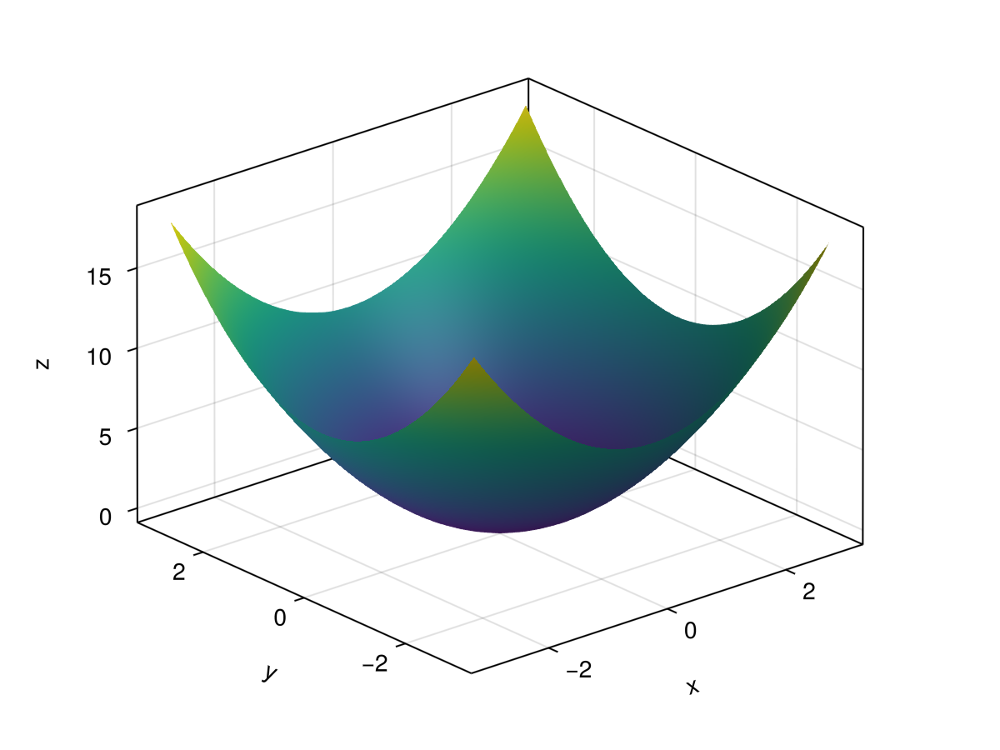

In [75]:
xs = ys = LinRange(-3, 3, 100)
zs = [x^2 + y^2 for x in xs, y in ys]
fig = surface(xs, ys, zs, axis=(type=Axis3,))

In [72]:
save("$output_dir/paraboloid.png", fig)

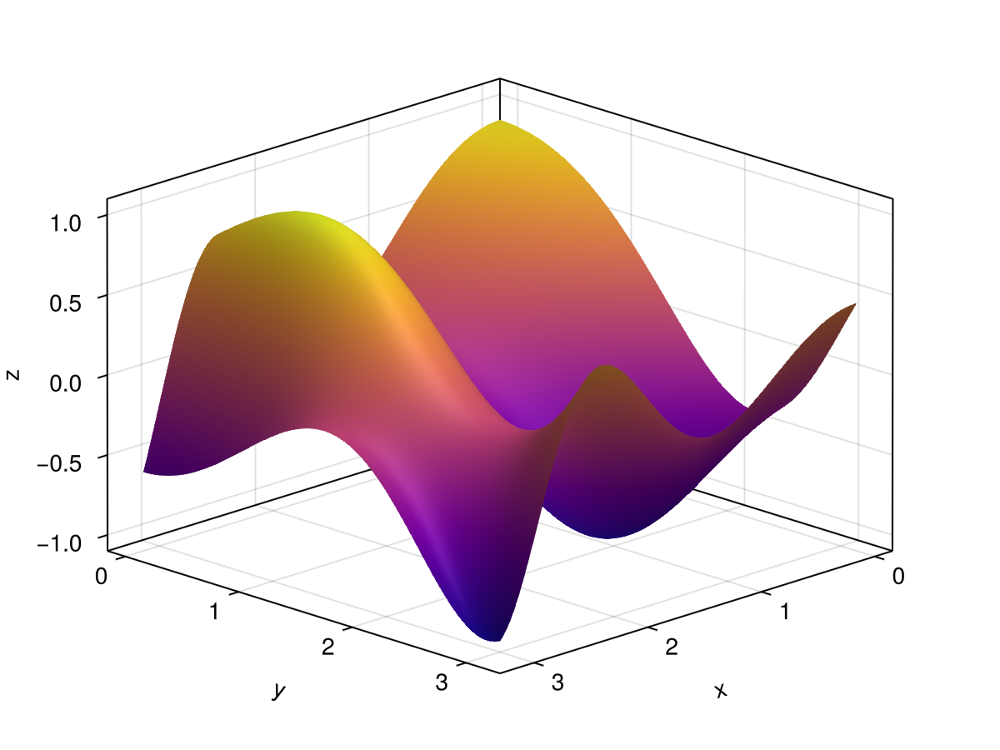

In [88]:
f(x, y) = sin(0.5x^2 - 0.25y^2 + 2) * cos(x + y)
xs = ys = LinRange(0, pi, 101)
zs = [f(x, y) for x in xs, y in ys]
fig = Figure()
ax = Axis3(fig[1,1],
  azimuth = 0.25pi,
  elevation = 0.1pi,)
surface!(ax, xs, ys, zs, colormap = :plasma)
fig

In [89]:
save("$output_dir/surface03.png", fig)

In [87]:
Makie.available_gradients()

Gradient Symbol/Strings:
    Accent
    Accent_3
    Accent_4
    Accent_5
    Accent_6
    Accent_7
    Accent_8
    Anemone
    Archambault
    AsteroidCity1
    AsteroidCity2
    AsteroidCity3
    Austria
    Bay
    Benedictus
    Blues
    Blues_3
    Blues_4
    Blues_5
    Blues_6
    Blues_7
    Blues_8
    Blues_9
    BottleRocket1
    BottleRocket2
    BrBG
    BrBG_10
    BrBG_11
    BrBG_3
    BrBG_4
    BrBG_5
    BrBG_6
    BrBG_7
    BrBG_8
    BrBG_9
    BrBg
    BuGn
    BuGn_3
    BuGn_4
    BuGn_5
    BuGn_6
    BuGn_7
    BuGn_8
    BuGn_9
    BuPu
    BuPu_3
    BuPu_4
    BuPu_5
    BuPu_6
    BuPu_7
    BuPu_8
    BuPu_9
    CMRmap
    Cascades
    Cassatt1
    Cassatt2
    Catppuccin_frappe
    Catppuccin_latte
    Catppuccin_macchiato
    Catppuccin_mocha
    Cavalcanti1
    Chevalier1
    Cross
    Darjeeling1
    Darjeeling2
    Dark2
    Dark2_3
    Dark2_4
    Dark2_5
    Dark2_6
    Dark2_7
    Dark2_8
    Degas
    Demuth
    Derain
    Egypt
    Fantasti

### Contour Plots

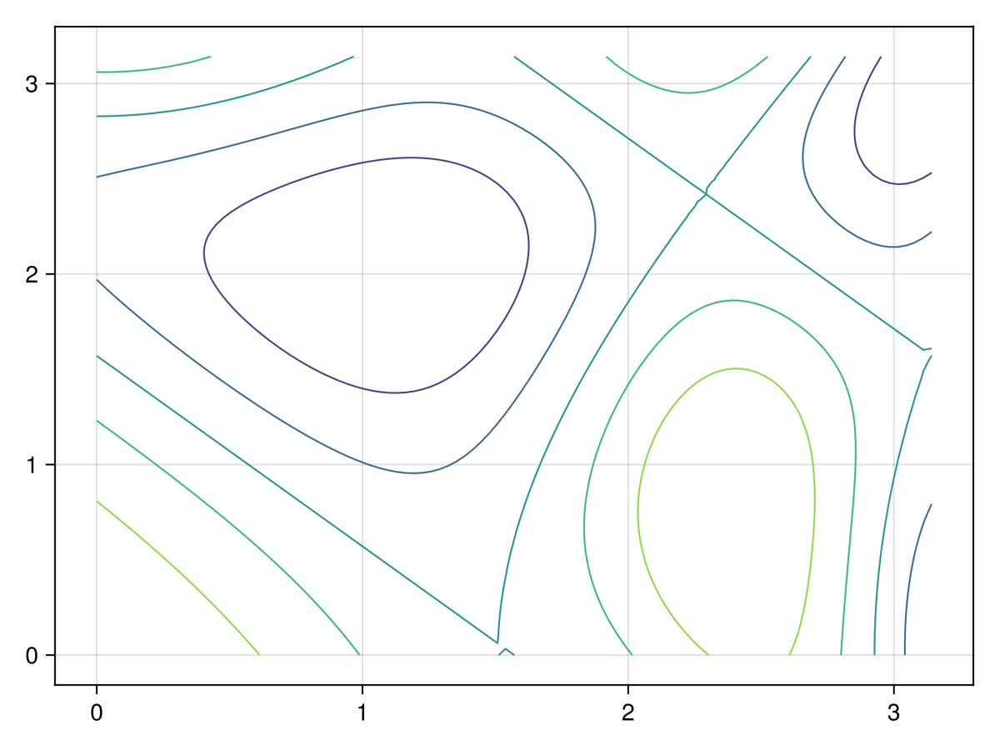

In [95]:
x = y = LinRange(0,pi,101)
fig = contour(x, y, f)

In [ ]:
save("../assets/plots/makie/contour1.png", fig)


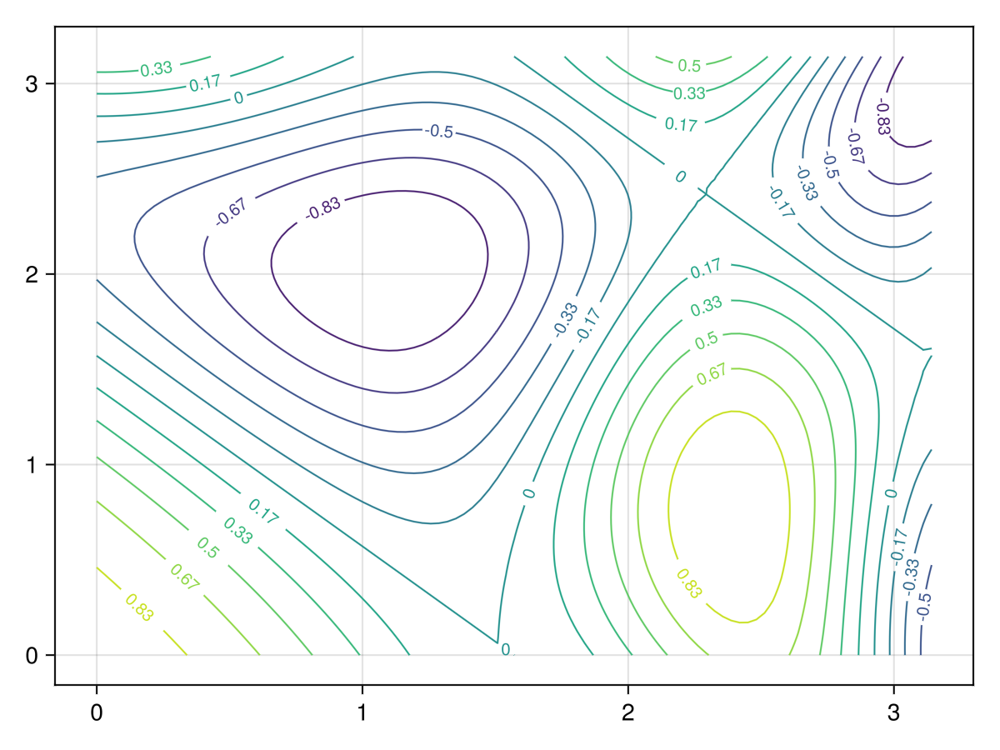

In [90]:
x = y = LinRange(0,pi,101)
fig = contour( x, y, f, labels = true, levels = 11)


In [92]:
save("$output_dir/contour2.png", fig)

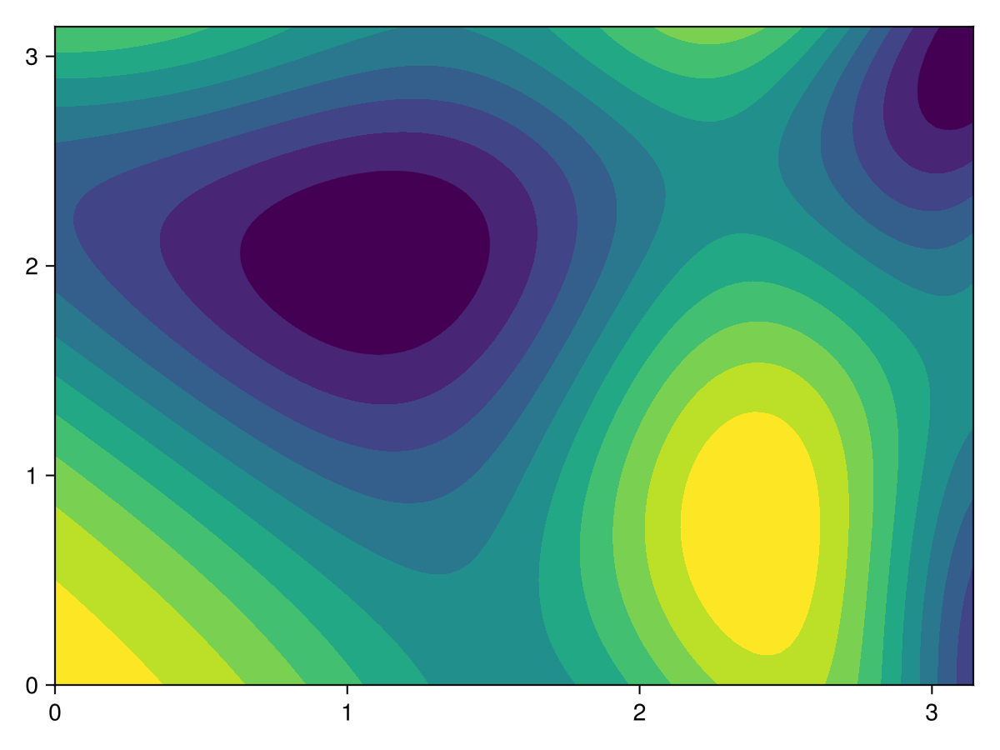

In [96]:
x = y = LinRange(0,pi,101)
fig = contourf( x, y, f, levels = 11)

In [ ]:
save("$output_dir/contourf.png", fig)


LoadError: SystemError: opening file "/Users/pstaab/code/sci-comp-book/julia-output/assets/plots/makie/contourf.png": No such file or directory

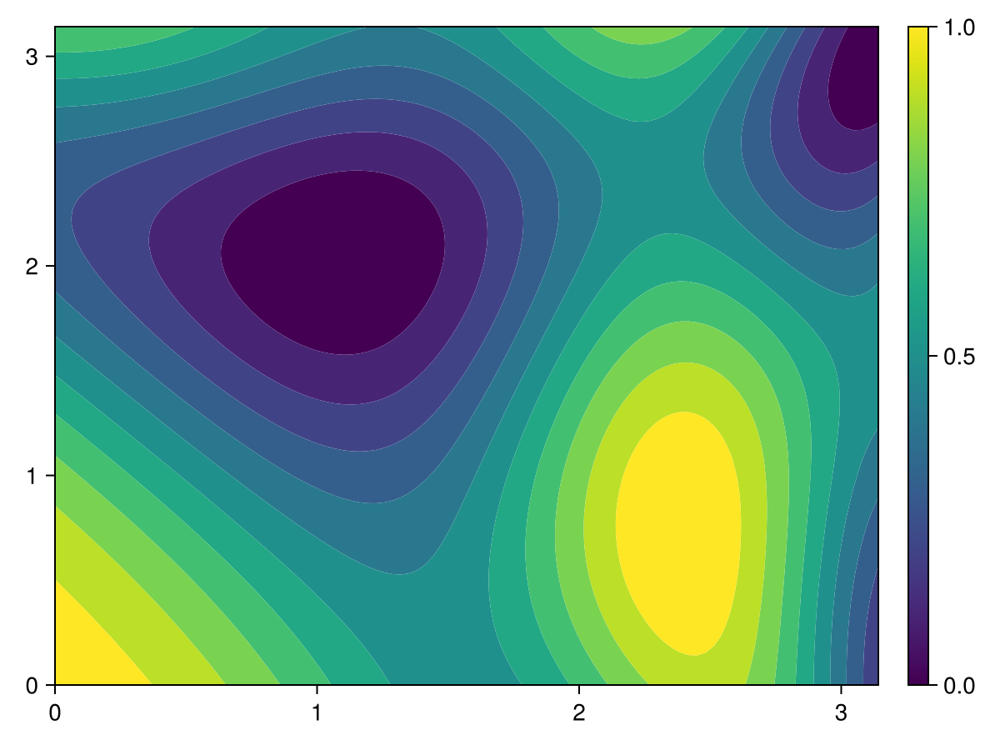

In [ ]:
x = y = LinRange(0,pi,101)
fig = Figure()
ax = Axis(fig[1,1])
contourf!(ax, x, y, (x, y) -> sin(0.5x^2-0.25y^2+2)*cos(x+y), levels = 11)
Colorbar(fig[1,2])
fig

In [ ]:
save("../assets/plots/makie/contourf1.png", fig)


CairoMakie.Screen{IMAGE}


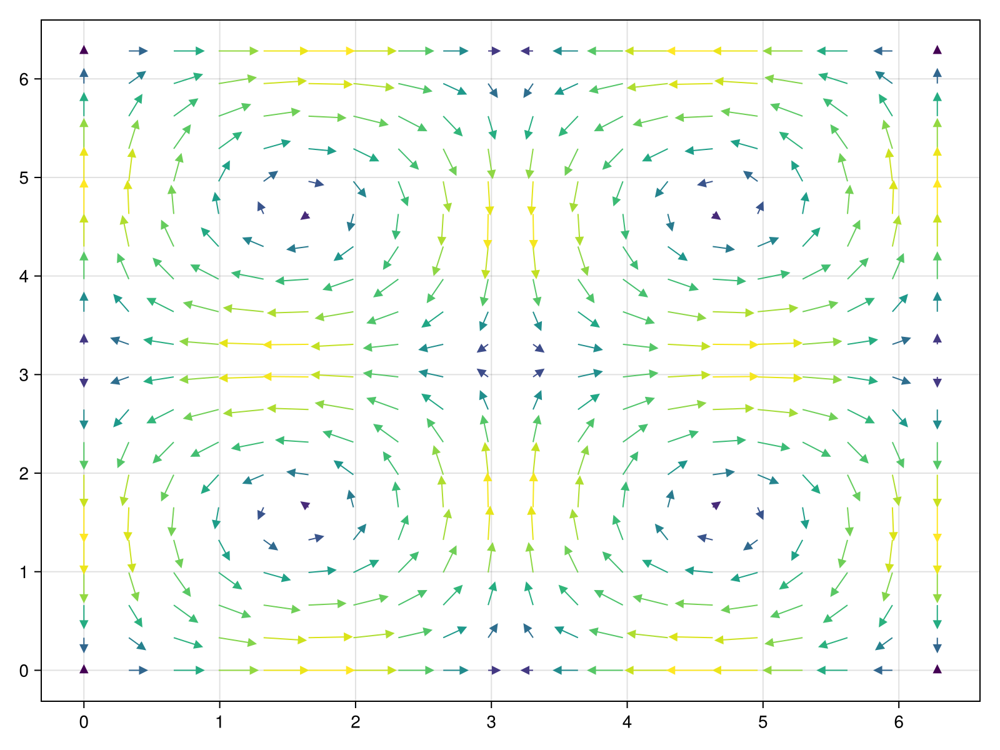

In [ ]:
# fig = Figure(size = (800, 600))
# Axis(fig[1, 1])

xs = LinRange(0, 2pi, 20)
ys = LinRange(0, 2pi, 20)
us = [sin(x) * cos(y) for x in xs, y in ys]
vs = [-cos(x) * sin(y) for x in xs, y in ys]
strength = vec(sqrt.(us .^ 2 .+ vs .^ 2))

arrows(xs, ys, us, vs, arrowsize = 10, lengthscale = 0.3,
    arrowcolor = strength, linecolor = strength)

f

In [ ]:
save("../assets/plots/makie/vector.png", f)

CairoMakie.Screen{IMAGE}


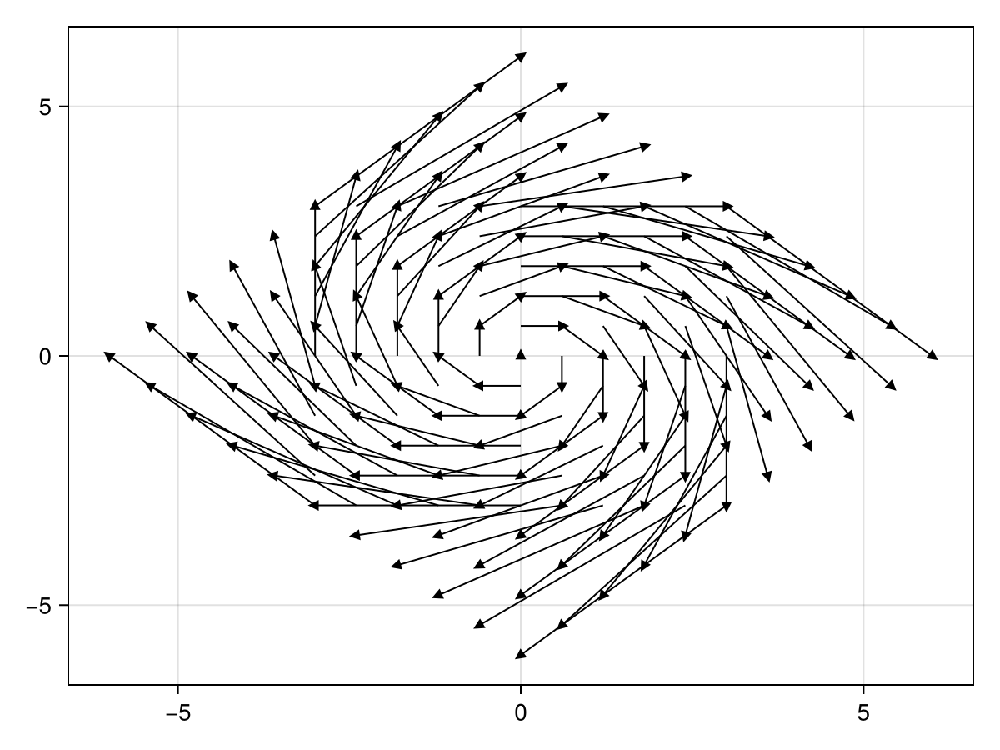

In [ ]:
xpts = ypts = LinRange(-3,3,11)
u = [y for x in xpts, y in ypts]
v = [-x for x in xpts, y in ypts]
fig = arrows(xpts,ypts,u,v)


In [ ]:
save("../assets/plots/makie/arrows01.png", fig)

CairoMakie.Screen{IMAGE}


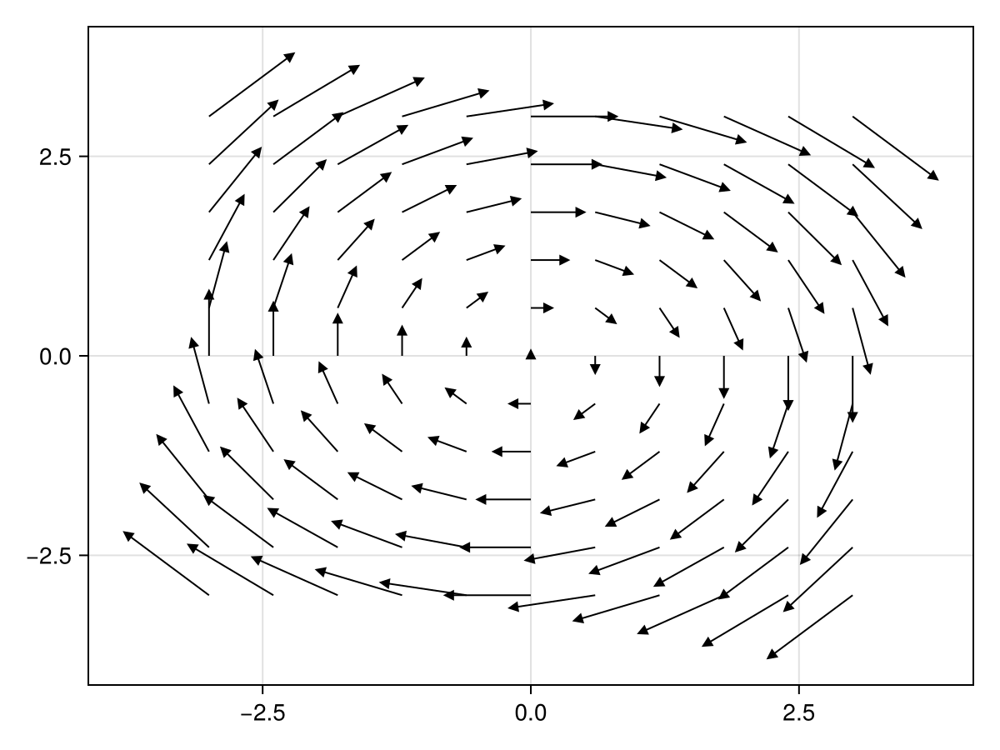

In [ ]:
xpts = ypts = LinRange(-3,3,11)
u = [y for x in xpts, y in ypts]
v = [-x for x in xpts, y in ypts]
fig = arrows(xpts,ypts,u,v, lengthscale = 0.25)

In [ ]:
save("../assets/plots/makie/arrows02.png", fig)

CairoMakie.Screen{IMAGE}


In [ ]:
str = sqrt.(u.^2+v.^2)

11×11 Matrix{Float64}:
 4.24264  3.84187  3.49857  3.2311   …  3.2311   3.49857  3.84187  4.24264
 3.84187  3.39411  3.0      2.68328     2.68328  3.0      3.39411  3.84187
 3.49857  3.0      2.54558  2.16333     2.16333  2.54558  3.0      3.49857
 3.2311   2.68328  2.16333  1.69706     1.69706  2.16333  2.68328  3.2311
 3.05941  2.47386  1.89737  1.34164     1.34164  1.89737  2.47386  3.05941
 3.0      2.4      1.8      1.2      …  1.2      1.8      2.4      3.0
 3.05941  2.47386  1.89737  1.34164     1.34164  1.89737  2.47386  3.05941
 3.2311   2.68328  2.16333  1.69706     1.69706  2.16333  2.68328  3.2311
 3.49857  3.0      2.54558  2.16333     2.16333  2.54558  3.0      3.49857
 3.84187  3.39411  3.0      2.68328     2.68328  3.0      3.39411  3.84187
 4.24264  3.84187  3.49857  3.2311   …  3.2311   3.49857  3.84187  4.24264

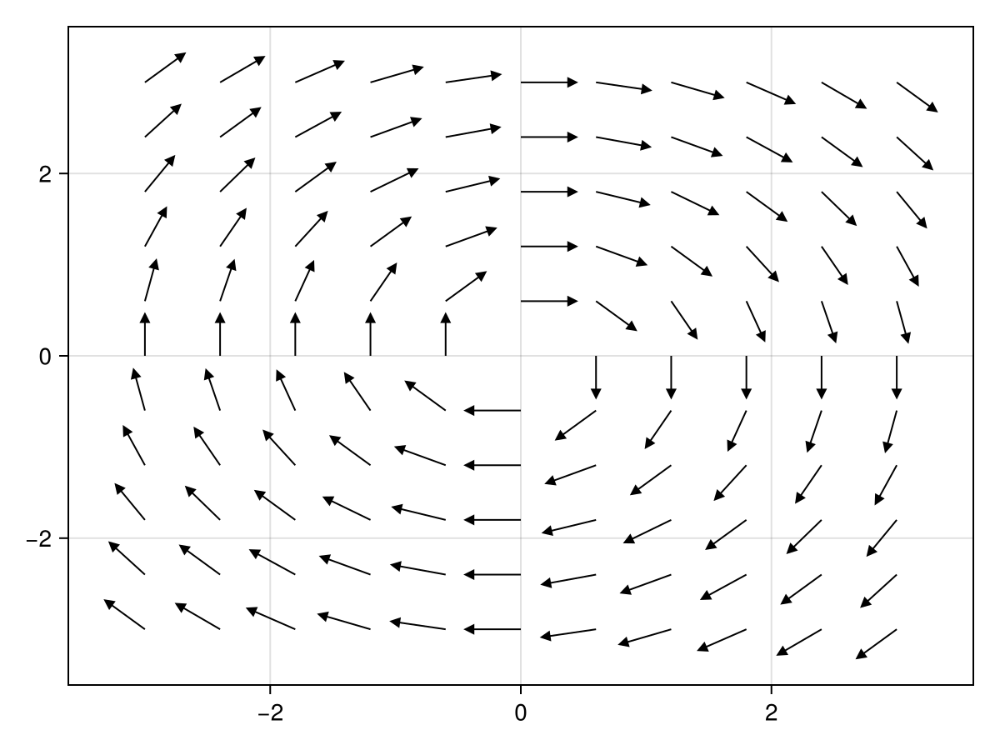

In [ ]:
fig = arrows(xpts,ypts,u./str,v./str, lengthscale = 0.4)

In [ ]:
save("../assets/plots/makie/arrow03.png", fig)

CairoMakie.Screen{IMAGE}


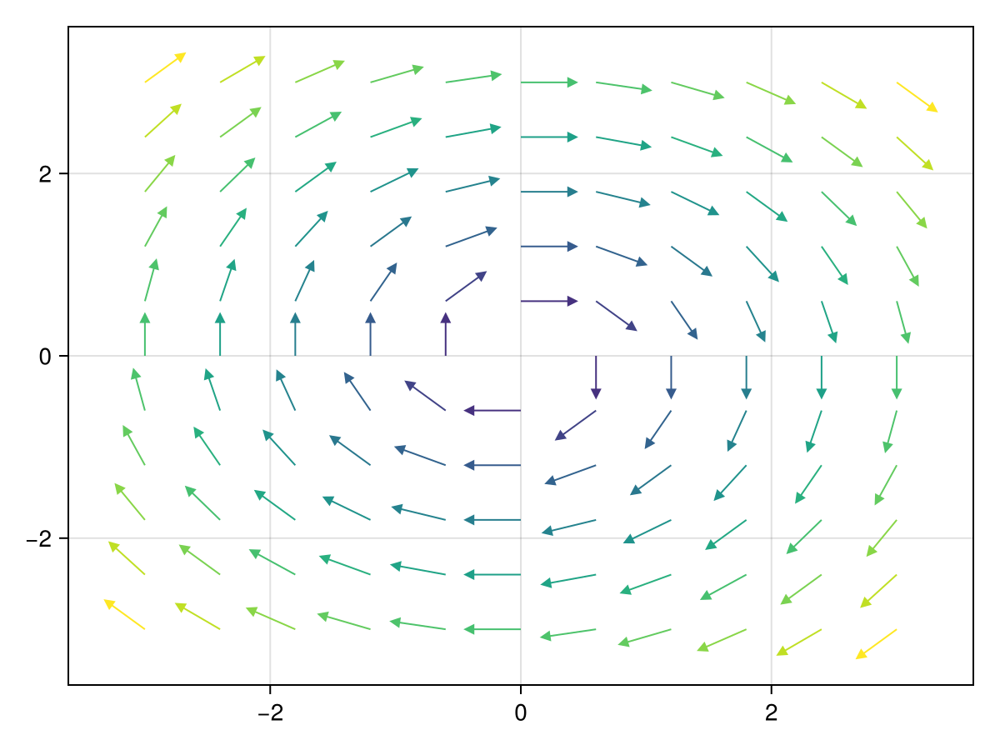

In [ ]:
fig = arrows(xpts,ypts,u./str,v./str, lengthscale = 0.4, arrowcolor = vec(str), linecolor = vec(str))

In [ ]:
save("../assets/plots/makie/arrow04.png", fig)

CairoMakie.Screen{IMAGE}


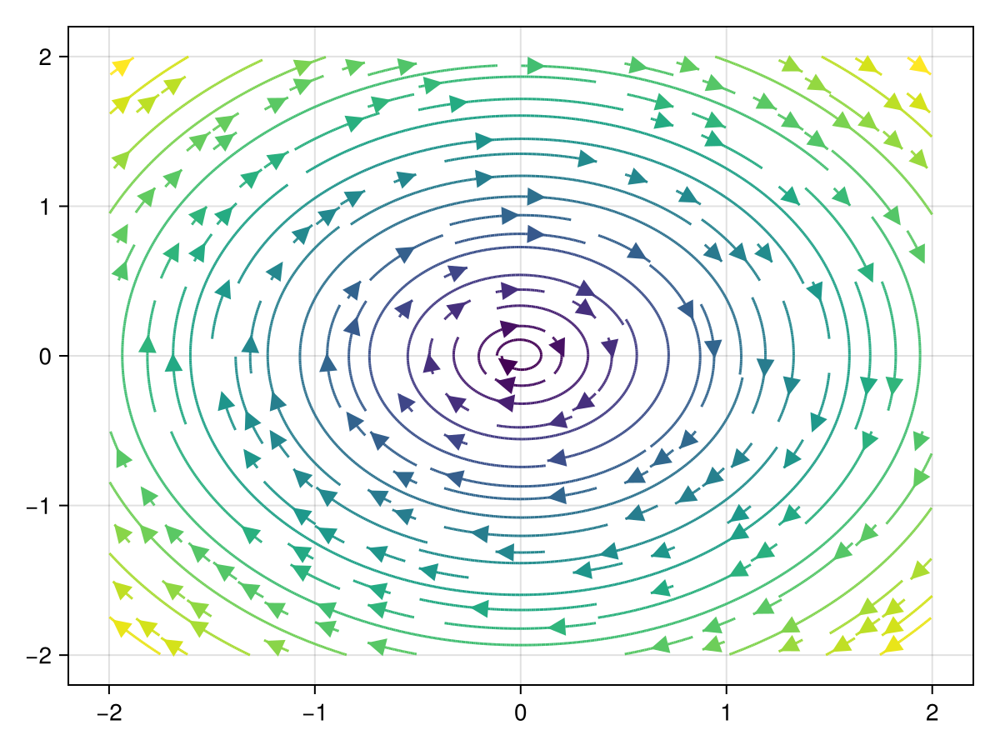

In [ ]:
fig = streamplot(x->Point2f(x[2], -x[1]), -2..2, -2..2)

In [ ]:
save("../assets/plots/makie/stream01.png", fig)

CairoMakie.Screen{IMAGE}


In [ ]:
typeof(Point2f(1,1))

Point{2, Float32}

In [ ]:
using GLMakie
GLMakie.activate!()

# This will open a dedicated high-performance window
fig = Figure()
ax = Axis3(fig[1, 1])
scatter!(ax, rand(10), rand(10), rand(10))
display(fig)

GLMakie.Screen(...)

: 